In [1]:
here::i_am("rna_atac/bigwigs/get_tracks.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(ArchR))

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 21

# Multi core using future - built in to seurat
plan("multicore", workers = 16)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code

Warning message:
“package ‘rtracklayer’ was built under R version 4.2.3”

                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | 

#### Load ArchR

In [2]:
args = list()

# Metadata
args$metadata = file.path(io$basedir, 'results/rna_atac/clustering/metadata_celltype_annotated_v2.txt.gz')

# Archr
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')

In [3]:
# Load meta
meta = fread(args$metadata)[day!='D3'] %>% # remove D3 cells
    .[,celltype_genotype:=paste0(celltype_v1, '-', genotype)] %>% 
    .[,celltypeV2_genotype:=paste0(celltype_v2, '-', genotype)]

In [4]:
# Load ArchRproject
ArchRProject <- loadArchRProject(args$archr_directory)[meta$cell]

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [5]:
ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.character(meta$celltype_v1),
                                    cells = meta$cell,
                                    name = "celltype_v1",
                                    force=TRUE)

ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.character(meta$celltype_genotype),
                                    cells = meta$cell,
                                    name = "celltype_genotype",
                                    force=TRUE)

ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.character(meta$celltype_v2),
                                    cells = meta$cell,
                                    name = "celltype_v2",
                                    force=TRUE)

ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.character(meta$celltypeV2_genotype),
                                    cells = meta$cell,
                                    name = "celltypeV2_genotype",
                                    force=TRUE)

Overriding previous entry for celltype_genotype



# Old

In [4]:
# addArchRThreads(24)
# getGroupBW(
#   ArchRProj = ArchRProject,
#   groupBy = 'celltype_genotype',
#   normMethod = c("ReadsInTSS"),
#   tileSize = 10,
#   maxCells = 1000, # default
#   ceiling = 4
# )

In [6]:
addArchRThreads(24)
getGroupBW(
  ArchRProj = ArchRProject,
  groupBy = 'celltype_genotype',
  normMethod = c("ReadsInTSS"),
  tileSize = 100,
  maxCells = 1000, # default
  ceiling = 4
)

Setting default number of Parallel threads to 24.

ArchR logging to : ArchRLogs/ArchR-getGroupBW-2bd7c63514eed-Date-2024-02-23_Time-15-27-46.log
If there is an issue, please report to github with logFile!

2024-02-23 15:28:12 : Allantois_Precursor-KO (1 of 22) : Creating BigWig for Group, 0.445 mins elapsed.

2024-02-23 15:28:46 : Allantois_Precursor-WT (2 of 22) : Creating BigWig for Group, 1.001 mins elapsed.

2024-02-23 15:29:13 : Allantois-KO (3 of 22) : Creating BigWig for Group, 1.454 mins elapsed.

2024-02-23 15:29:32 : Allantois-WT (4 of 22) : Creating BigWig for Group, 1.766 mins elapsed.

2024-02-23 15:29:43 : Blood_Progenitor-KO (5 of 22) : Creating BigWig for Group, 1.962 mins elapsed.

2024-02-23 15:29:46 : Blood_Progenitor-WT (6 of 22) : Creating BigWig for Group, 2.008 mins elapsed.

2024-02-23 15:29:57 : Early_Mes_EOd-KO (7 of 22) : Creating BigWig for Group, 2.193 mins elapsed.

2024-02-23 15:30:13 : Early_Mes_EOd-WT (8 of 22) : Creating BigWig for Group, 2.462 mins el

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Allantois_Precursor.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
 [2] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Allantois_Precursor.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
 [3] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Allantois.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"          
 [4] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Allantois.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"          
 [5] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Blood_Progenitor.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"   
 [6] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Blood_Progenitor.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"   
 [7] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Early_Mes_EOd.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"      
 [8] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Early_Mes_EOd.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"      
 [9] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Early_Mes_EOi.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"      
[10] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Early_Mes_EOi.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"      
[11] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Endothelium.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"        
[12] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Endothelium.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"        
[13] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/HE_Precursor.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"       
[14] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/HE_Precursor.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"       
[15] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/HE.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"                 
[16] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/HE.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"                 
[17] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Mesenchyme.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"         
[18] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Mesenchyme.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"         
[19] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Posterior_Mes.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"      
[20] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Posterior_Mes.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"      
[21] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltype_genotype/Primitive_Streak.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"   
[22] "/rds/

In [69]:
args = list()
args$canaveral = 'https://bioinformatics.stemcells.cam.ac.uk/Files_for_transfer/Open/bart/09_Eomes_degron_blood/bigwigs_tile100/'
args$bw_in = file.path(io$basedir, 'processed/atac/archR/GroupBigWigs/celltype_genotype/')

outfile = file.path(args$bw_in, 'ucsc_tracks.txt')

In [70]:
# ucsc tracks of in vitro
files = list.files(args$bw_in, 'bw')
celltype_genotypes = files %>% str_split('-') %>% map(1)
ucsc_tracks_vitro = list()
ucsc_tracks_vitro = mclapply(1:length(celltype_genotypes), function(x){
    print(celltype_genotypes[[x]])
    name = gsub('-', ' ', unique(meta$celltype_genotype)[order(unique(meta$celltype_genotype))][[x]])
    paste0('track type=bigWig name="',name,
           '" description="',name,
           '" color=',ifelse(grepl('KO', name), '255,000,000', '000,000,000'),
           ' visibility=0 bigDataUrl=',args$canaveral,celltype_genotypes[[x]],
           '-TileSize-100-normMethod-ReadsInTSS-ArchR.bw') # used TileSize 10 before but looks noisy sometimes because too high resolution.
},mc.cores=1) %>% unlist() %>% noquote() 

[1] "Allantois_Precursor.KO"
[1] "Allantois_Precursor.WT"
[1] "Allantois.KO"
[1] "Allantois.WT"
[1] "Blood_Progenitor.KO"
[1] "Blood_Progenitor.WT"
[1] "Early_Mes_EOd.KO"
[1] "Early_Mes_EOd.WT"
[1] "Early_Mes_EOi.KO"
[1] "Early_Mes_EOi.WT"
[1] "Endothelium.KO"
[1] "Endothelium.WT"
[1] "HE_Precursor.KO"
[1] "HE_Precursor.WT"
[1] "HE.KO"
[1] "HE.WT"
[1] "Mesenchyme.KO"
[1] "Mesenchyme.WT"
[1] "Posterior_Mes.KO"
[1] "Posterior_Mes.WT"
[1] "Primitive_Streak.KO"
[1] "Primitive_Streak.WT"


In [71]:
# matching ucsc track of in vivo
args = list()
args$canaveral = 'https://bioinformatics.stemcells.cam.ac.uk/Files_for_transfer/Open/bart/gastrulation_multiome/'
args$bw_in = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/data/processed/atac/archR/GroupBigWigs/celltype_genotype/'

celltypes = c('Primitive_Streak', 
              'Nascent_mesoderm', 
              'Mixed_mesoderm', 
              'ExE_mesoderm',
              'Allantois',
              'Mesenchyme',
              'Haematoendothelial_progenitors',
              'Endothelium',
              'Blood_progenitors_1'
             )
ucsc_tracks_atlas = lapply(celltypes, function(x){
    paste0('track type=bigWig name="',x,
           ' (Atlas)" description="',x,
           '" color=',paste(as.vector(col2rgb(opts$celltype.colors[x])), collapse = ","),
           ' visibility=0 bigDataUrl=',args$canaveral,x,
           '.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw') # Before didn't take only WT cells so was actually a mix with the T KO
}) %>% unlist() %>% noquote() 

In [72]:
TAL1 = 'track type=bigWig name="Tal1 ChIP" description="Tal1 ChIP" color=000,153,076 visibility=2 bigDataUrl=https://bioinformatics.stemcells.cam.ac.uk/Files_for_transfer/Open/bart/09_Eomes_degron_blood/chip/WT_MES_Scl_rep1_mm10.bw'
H3K4me1 = 'track type=bigWig name="H3K4me1 ChIP" description="H3K4me1 ChIP" color=204,000,000 visibility=2 bigDataUrl=https://bioinformatics.stemcells.cam.ac.uk/Files_for_transfer/Open/bart/09_Eomes_degron_blood/chip/WT_MES_H3K4me1_mm10.bw'
H3K27Ac = 'track type=bigWig name="H3K27Ac ChIP" description="H3K27Ac ChIP" color=204,102,000 visibility=2 bigDataUrl=https://bioinformatics.stemcells.cam.ac.uk/Files_for_transfer/Open/bart/09_Eomes_degron_blood/chip/WT_MES_H3K27ac_mm10.bw'
Eomes = 'track type=bigWig name="Eomes-GFP ChIP (GSE128466)" description="Eomes-GFP ChIP" color=000,102,204 visibility=2 bigDataUrl=https://bioinformatics.stemcells.cam.ac.uk/Files_for_transfer/Open/bart/09_Eomes_degron_blood/chip/GSE128466_bamCoverage_ChIP_EoGFP_dox.bigwig'

In [73]:
ucsc_tracks = c(sort(c(ucsc_tracks_vitro, ucsc_tracks_atlas)), TAL1, H3K4me1, H3K27Ac, Eomes)
writeLines(ucsc_tracks, outfile)

In [83]:
# matching ucsc track of in vivo - Endothelial subsets
args = list()
args$canaveral = 'https://bioinformatics.stemcells.cam.ac.uk/Files_for_transfer/Open/bart/gastrulation_multiome/'
args$bw_in = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/data/processed/atac/archR/GroupBigWigs/cluster/'

celltypes = c('Allantois_endothelium', 
              'EP_endothelium', 
              'Unknown_endothelium', 
              'YS_endothelium'
             )
opts$endo_celltype.colors = c(
    'Allantois_endothelium' = '#2f4a60', 
    'EP_endothelium' = '#90e3bf', 
    'Unknown_endothelium' = '#AE3F3F', 
    'YS_endothelium' = '#ff891c'
)

ucsc_tracks_atlas_endo = lapply(celltypes, function(x){
    paste0('track type=bigWig name="',x,
           ' (Atlas)" description="',x,
           '" color=',paste(as.vector(col2rgb(opts$endo_celltype.colors[x])), collapse = ","),
           ' visibility=0 bigDataUrl=',args$canaveral,x,
           '-TileSize-100-normMethod-ReadsInTSS-ArchR.bw') # Before didn't take only WT cells so was actually a mix with the T KO
}) %>% unlist() %>% noquote() 

In [84]:
ucsc_tracks_endo = c(  ucsc_tracks_vitro[grep('HE ', ucsc_tracks_vitro)],
                        ucsc_tracks_vitro[grep('Endothelium', ucsc_tracks_vitro)],
                        ucsc_tracks_atlas_endo,
                        ucsc_tracks[grep('Allantois ', ucsc_tracks)])

args$bw_in = file.path(io$basedir, 'processed/atac/archR/GroupBigWigs/celltype_genotype/')
writeLines(ucsc_tracks_endo, file.path(args$bw_in, 'ucsc_tracks_endo.txt'))

# New

In [6]:
addArchRThreads(24)
getGroupBW(
  ArchRProj = ArchRProject,
  groupBy = 'celltypeV2_genotype',
  normMethod = c("ReadsInTSS"),
  tileSize = 100,
  maxCells = 1000, # default
  ceiling = 4
)

Setting default number of Parallel threads to 24.

ArchR logging to : ArchRLogs/ArchR-getGroupBW-11f0f875a8f080-Date-2024-04-29_Time-12-05-11.log
If there is an issue, please report to github with logFile!

2024-04-29 12:05:42 : Allantois_Precursor-KO (1 of 24) : Creating BigWig for Group, 0.521 mins elapsed.

2024-04-29 12:06:14 : Allantois_Precursor-WT (2 of 24) : Creating BigWig for Group, 1.056 mins elapsed.

2024-04-29 12:06:40 : Allantois-KO (3 of 24) : Creating BigWig for Group, 1.477 mins elapsed.

2024-04-29 12:06:56 : Allantois-WT (4 of 24) : Creating BigWig for Group, 1.747 mins elapsed.

2024-04-29 12:07:06 : Blood_Progenitor-KO (5 of 24) : Creating BigWig for Group, 1.918 mins elapsed.

2024-04-29 12:07:08 : Blood_Progenitor-WT (6 of 24) : Creating BigWig for Group, 1.953 mins elapsed.

2024-04-29 12:07:18 : Early_Mes_EOd-KO (7 of 24) : Creating BigWig for Group, 2.116 mins elapsed.

2024-04-29 12:07:32 : Early_Mes_EOd-WT (8 of 24) : Creating BigWig for Group, 2.348 mins e

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Allantois_Precursor.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
 [2] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Allantois_Precursor.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
 [3] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Allantois.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"          
 [4] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Allantois.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"          
 [5] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Blood_Progenitor.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"   
 [6] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Blood_Progenitor.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"   
 [7] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Early_Mes_EOd.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"      
 [8] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Early_Mes_EOd.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"      
 [9] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Early_Mes_EOi.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"      
[10] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Early_Mes_EOi.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"      
[11] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Endothelium.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"        
[12] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Endothelium.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"        
[13] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/HE_Precursor.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"       
[14] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/HE_Precursor.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"       
[15] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/HE.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"                 
[16] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/HE.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"                 
[17] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Mesenchyme.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"         
[18] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Mesenchyme.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"         
[19] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/PGC.KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"                
[20] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/PGC.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"                
[21] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Posterior_Mes.KO-TileSize-100-normMet

In [9]:
args = list()
args$canaveral = 'https://data.cyverse.org/dav-anon/iplant/home/theeuwes/analyses/Eomes_HE/Celltype_v2/'
args$bw_in = file.path(io$basedir, 'processed/atac/archR/GroupBigWigs/celltypeV2_genotype/')

outfile = file.path(args$bw_in, 'ucsc_tracks.txt')

In [12]:
celltype_genotypes

[[1]]
[1] "Allantois_Precursor.KO"

[[2]]
[1] "Allantois_Precursor.WT"

[[3]]
[1] "Allantois.KO"

[[4]]
[1] "Allantois.WT"

[[5]]
[1] "Blood_Progenitor.KO"

[[6]]
[1] "Blood_Progenitor.WT"

[[7]]
[1] "Early_Mes_EOd.KO"

[[8]]
[1] "Early_Mes_EOd.WT"

[[9]]
[1] "Early_Mes_EOi.KO"

[[10]]
[1] "Early_Mes_EOi.WT"

[[11]]
[1] "Endothelium.KO"

[[12]]
[1] "Endothelium.WT"

[[13]]
[1] "HE_Precursor.KO"

[[14]]
[1] "HE_Precursor.WT"

[[15]]
[1] "HE.KO"

[[16]]
[1] "HE.WT"

[[17]]
[1] "Mesenchyme.KO"

[[18]]
[1] "Mesenchyme.WT"

[[19]]
[1] "PGC.KO"

[[20]]
[1] "PGC.WT"

[[21]]
[1] "Posterior_Mes.KO"

[[22]]
[1] "Posterior_Mes.WT"

[[23]]
[1] "Primitive_Streak.KO"

[[24]]
[1] "Primitive_Streak.WT"

In [16]:
# ucsc tracks of in vitro
files = list.files(args$bw_in, 'bw')
celltype_genotypes = files %>% str_split('-') %>% map(1)
ucsc_tracks_vitro = list()
ucsc_tracks_vitro = mclapply(1:length(celltype_genotypes), function(x){
    print(celltype_genotypes[[x]])
    name = gsub('\\.', ' ', celltype_genotypes[[x]])
    paste0('track type=bigWig name="',name,
           '" description="',name,
           '" color=',ifelse(grepl('KO', name), '255,000,000', '000,000,000'),
           ' visibility=0 bigDataUrl=',args$canaveral,celltype_genotypes[[x]],
           '-TileSize-100-normMethod-ReadsInTSS-ArchR.bw') # used TileSize 10 before but looks noisy sometimes because too high resolution.
},mc.cores=1) %>% unlist() %>% noquote() 

[1] "Allantois_Precursor.KO"
[1] "Allantois_Precursor.WT"
[1] "Allantois.KO"
[1] "Allantois.WT"
[1] "Blood_Progenitor.KO"
[1] "Blood_Progenitor.WT"
[1] "Early_Mes_EOd.KO"
[1] "Early_Mes_EOd.WT"
[1] "Early_Mes_EOi.KO"
[1] "Early_Mes_EOi.WT"
[1] "Endothelium.KO"
[1] "Endothelium.WT"
[1] "HE_Precursor.KO"
[1] "HE_Precursor.WT"
[1] "HE.KO"
[1] "HE.WT"
[1] "Mesenchyme.KO"
[1] "Mesenchyme.WT"
[1] "PGC.KO"
[1] "PGC.WT"
[1] "Posterior_Mes.KO"
[1] "Posterior_Mes.WT"
[1] "Primitive_Streak.KO"
[1] "Primitive_Streak.WT"


In [18]:
# matching ucsc track of in vivo
args = list()
args$canaveral = 'https://data.cyverse.org/dav-anon/iplant/home/theeuwes/analyses/Atlas/'
args$bw_in = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/data/processed/atac/archR/GroupBigWigs/celltype_genotype/'

celltypes = c('Primitive_Streak', 
              'Nascent_mesoderm', 
              'Mixed_mesoderm', 
              'ExE_mesoderm',
              'Allantois',
              'Mesenchyme',
              'Haematoendothelial_progenitors',
              'Endothelium',
              'Blood_progenitors_1'
             )
ucsc_tracks_atlas = lapply(celltypes, function(x){
    paste0('track type=bigWig name="',x,
           '" description="',x,
           '" color=',paste(as.vector(col2rgb(opts$celltype.colors[x])), collapse = ","),
           ' visibility=0 bigDataUrl=',args$canaveral,x,
           '.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw') # Before didn't take only WT cells so was actually a mix with the T KO
}) %>% unlist() %>% noquote() 

In [ ]:
# TAL1 = 'track type=bigWig name="Tal1 ChIP" description="Tal1 ChIP" color=000,153,076 visibility=2 bigDataUrl=https://bioinformatics.stemcells.cam.ac.uk/Files_for_transfer/Open/bart/09_Eomes_degron_blood/chip/WT_MES_Scl_rep1_mm10.bw'
# H3K4me1 = 'track type=bigWig name="H3K4me1 ChIP" description="H3K4me1 ChIP" color=204,000,000 visibility=2 bigDataUrl=https://bioinformatics.stemcells.cam.ac.uk/Files_for_transfer/Open/bart/09_Eomes_degron_blood/chip/WT_MES_H3K4me1_mm10.bw'
# H3K27Ac = 'track type=bigWig name="H3K27Ac ChIP" description="H3K27Ac ChIP" color=204,102,000 visibility=2 bigDataUrl=https://bioinformatics.stemcells.cam.ac.uk/Files_for_transfer/Open/bart/09_Eomes_degron_blood/chip/WT_MES_H3K27ac_mm10.bw'
# Eomes = 'track type=bigWig name="Eomes-GFP ChIP (GSE128466)" description="Eomes-GFP ChIP" color=000,102,204 visibility=2 bigDataUrl=https://bioinformatics.stemcells.cam.ac.uk/Files_for_transfer/Open/bart/09_Eomes_degron_blood/chip/GSE128466_bamCoverage_ChIP_EoGFP_dox.bigwig'

In [19]:
ucsc_tracks = c(sort(c(ucsc_tracks_vitro, ucsc_tracks_atlas)))
writeLines(ucsc_tracks, outfile)

In [20]:
# matching ucsc track of in vivo - Endothelial subsets
args = list()
args$canaveral = 'https://data.cyverse.org/dav-anon/iplant/home/theeuwes/analyses/Atlas/Endothelium/'
args$bw_in = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/data/processed/atac/archR/GroupBigWigs/cluster/'

celltypes = c('Allantois_endothelium', 
              'EP_endothelium', 
              'Unknown_endothelium', 
              'YS_endothelium'
             )
opts$endo_celltype.colors = c(
    'Allantois_endothelium' = '#2f4a60', 
    'EP_endothelium' = '#90e3bf', 
    'Unknown_endothelium' = '#AE3F3F', 
    'YS_endothelium' = '#ff891c'
)

ucsc_tracks_atlas_endo = lapply(celltypes, function(x){
    paste0('track type=bigWig name="',x,
           ' (Atlas)" description="',x,
           '" color=',paste(as.vector(col2rgb(opts$endo_celltype.colors[x])), collapse = ","),
           ' visibility=0 bigDataUrl=',args$canaveral,x,
           '-TileSize-100-normMethod-ReadsInTSS-ArchR.bw') # Before didn't take only WT cells so was actually a mix with the T KO
}) %>% unlist() %>% noquote() 

In [21]:
ucsc_tracks_endo = c(  ucsc_tracks_vitro[grep('HE ', ucsc_tracks_vitro)],
                        ucsc_tracks_vitro[grep('Endothelium', ucsc_tracks_vitro)],
                        ucsc_tracks_atlas_endo,
                        ucsc_tracks[grep('Allantois ', ucsc_tracks)])

args$bw_in = file.path(io$basedir, 'processed/atac/archR/GroupBigWigs/celltypeV2_genotype/')
writeLines(ucsc_tracks_endo, file.path(args$bw_in, 'ucsc_tracks_endo.txt'))

# Signac browser tracks

In [5]:
args$atlas_bws = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/data/processed/atac/archR/GroupBigWigs/celltype_genotype/'
atlas_celltypes = c('Primitive_Streak', 
              'Nascent_mesoderm', 
              'Mixed_mesoderm', 
              'ExE_mesoderm',
              'Allantois',
              'Mesenchyme',
              'Haematoendothelial_progenitors',
              'Endothelium',
              'Blood_progenitors_1'
             )
atlas_files = paste0(args$atlas_bws, atlas_celltypes, '.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw')

args$vitro_bws = file.path(io$basedir, 'processed/atac/archR/GroupBigWigs/celltypeV2_genotype/')
vitro_files = paste0(args$vitro_bws, list.files(args$vitro_bws, 'bw'))

In [6]:
bigwigs.data_vitro = data.table(celltype = list.files(args$vitro_bws, 'bw') %>% str_split(., '\\.') %>% map_chr(1),
                    genotype = list.files(args$vitro_bws, 'bw') %>% str_split(., '\\.') %>% map_chr(2) %>% str_split('-') %>% map_chr(1),
                    path =  paste0(args$vitro_bws, list.files(args$vitro_bws, 'bw'))) %>% 
                .[,name := paste0(celltype, '-', genotype)] %>% 
                .[,color := ifelse(genotype == 'KO', '#FF0000', '#000000')] %>% 
                .[name != 'Blood_Progenitor-KO']

bigwigs.data_vivo = data.table(celltype = gsub(args$atlas_bws, '', atlas_files) %>% str_split(., '\\.') %>% map_chr(1),
                    genotype = 'Atlas',
                    path =  atlas_files) %>% 
                .[,name := paste0(celltype, ' (Atlas)')] %>% 
                .[,color := opts$celltype.colors[celltype]]

bigwigs.data = rbind(bigwigs.data_vitro, bigwigs.data_vivo)

bw_list = lapply(bigwigs.data$path, function(x)return(x))
names(bw_list) = bigwigs.data$name

In [7]:
bw_order = c('Primitive_Streak (Atlas)','Primitive_Streak-KO','Primitive_Streak-WT',
             'Mixed_mesoderm (Atlas)','Nascent_mesoderm (Atlas)','Early_Mes_EOi-KO','Early_Mes_EOi-WT','Early_Mes_EOd-KO','Early_Mes_EOd-WT',
            'ExE_mesoderm (Atlas)','Posterior_Mes-KO','Posterior_Mes-WT',
            'Allantois_Precursor-KO','Allantois_Precursor-WT',
            'Allantois (Atlas)','Allantois-KO','Allantois-WT',
            'Mesenchyme (Atlas)','Mesenchyme-KO','Mesenchyme-WT',
            'Haematoendothelial_progenitors (Atlas)','HE_Precursor-KO','HE_Precursor-WT','HE-KO','HE-WT',
            'Endothelium (Atlas)','Endothelium-KO','Endothelium-WT',
            'Blood_progenitors_1 (Atlas)','Blood_Progenitor-WT',
             'PGC-KO','PGC-WT'
            )

In [8]:
bw_order

[1] "Primitive_Streak (Atlas)"              
 [2] "Primitive_Streak-KO"                   
 [3] "Primitive_Streak-WT"                   
 [4] "Mixed_mesoderm (Atlas)"                
 [5] "Nascent_mesoderm (Atlas)"              
 [6] "Early_Mes_EOi-KO"                      
 [7] "Early_Mes_EOi-WT"                      
 [8] "Early_Mes_EOd-KO"                      
 [9] "Early_Mes_EOd-WT"                      
[10] "ExE_mesoderm (Atlas)"                  
[11] "Posterior_Mes-KO"                      
[12] "Posterior_Mes-WT"                      
[13] "Allantois_Precursor-KO"                
[14] "Allantois_Precursor-WT"                
[15] "Allantois (Atlas)"                     
[16] "Allantois-KO"                          
[17] "Allantois-WT"                          
[18] "Mesenchyme (Atlas)"                    
[19] "Mesenchyme-KO"                         
[20] "Mesenchyme-WT"                         
[21] "Haematoendothelial_progenitors (Atlas)"
[22] "HE_Precursor-KO"                       
[23] "HE_Precursor-WT"                       
[24] "HE-KO"                                 
[25] "HE-WT"                                 
[26] "Endothelium (Atlas)"                   
[27] "Endothelium-KO"                        
[28] "Endothelium-WT"                        
[29] "Blood_progenitors_1 (Atlas)"           
[30] "Blood_Progenitor-WT"                   
[31] "PGC-KO"                                
[32] "PGC-WT"

In [9]:
bigwigs = bw_list[bw_order]

In [10]:
bigwigs_in = bigwigs[grep('-KO', names(bigwigs), invert=T)]

In [11]:
bigwig_order = c('Primitive_Streak (Atlas)','Primitive_Streak',
                 'Nascent_mesoderm (Atlas)','Mixed_mesoderm (Atlas)','Early_Mes_EOi','Early_Mes_EOd',
                'ExE_mesoderm (Atlas)','Posterior_Mes','Allantois_Precursor',
                 'Allantois (Atlas)','Allantois',
                 'Mesenchyme (Atlas)','Mesenchyme',
                 'Haematoendothelial_progenitors (Atlas)','HE_Precursor','HE',
                 'Endothelium (Atlas)','Endothelium',
                 'Blood_progenitors_1 (Atlas)','Blood_Progenitor',
                 'PGC'   
                )

bigwig_order = c('Primitive_Streak (Atlas)','Primitive_Streak',
                 'Nascent_mesoderm (Atlas)','Early_Mes_EOi','Early_Mes_EOd',
                 'Endothelium (Atlas)','Endothelium',
                 'Allantois (Atlas)','Allantois'
                )

WT_plot = bigwigs.data %>% copy() %>%
    .[genotype %in% c('WT', 'Atlas')] %>% 
    .[, name := ifelse(genotype=='WT', celltype, name)] %>% 
    .[, color := ifelse(genotype=='WT', opts$celltype_v2.colors[celltype], color)] %>% 
    .[match(bigwig_order, name)] %>% 
    .[, name := gsub('Haematoendothelial_progenitors', 'HE_progenitors', name)]

In [22]:
source(here::here("utils.R"))

In [19]:
options(repr.plot.width = 5, repr.plot.height = 15)
#WT_plot = WT_plot[1:2]
downsample = 1
heights = 1.2
gene_heights = 2
p1 = plot_browser_track(gene = NULL, input_region = 'chr17:35503295-35511133', bigwigs = WT_plot, extend.upstream = 1000, extend.downstream = 1000, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p2 = plot_browser_track(gene = NULL, input_region = 'chr9:118467852-118479695', bigwigs = WT_plot, extend.upstream = 1000, extend.downstream = 1000, downsample.rate = downsample, no_label = T, bw_height = heights, gene_height=gene_heights)
p3 = plot_browser_track(gene = NULL, input_region = 'chr7:79788409-79794564', bigwigs = WT_plot, extend.upstream = 1000, extend.downstream = 1000, downsample.rate = downsample, no_label = T, bw_height = heights, gene_height=gene_heights)
p4 = plot_browser_track(gene = NULL, input_region = 'chr8:104094306-104112911', bigwigs = WT_plot, extend.upstream = 1000, extend.downstream = 1000, downsample.rate = downsample, no_label = T, bw_height = heights, gene_height=gene_heights)
p5 = plot_browser_track(gene = NULL, input_region = 'chr11:85875007-85896484', bigwigs = WT_plot, extend.upstream = 1000, extend.downstream = 1000, downsample.rate = downsample, no_label = T, bw_height = heights, gene_height=gene_heights)

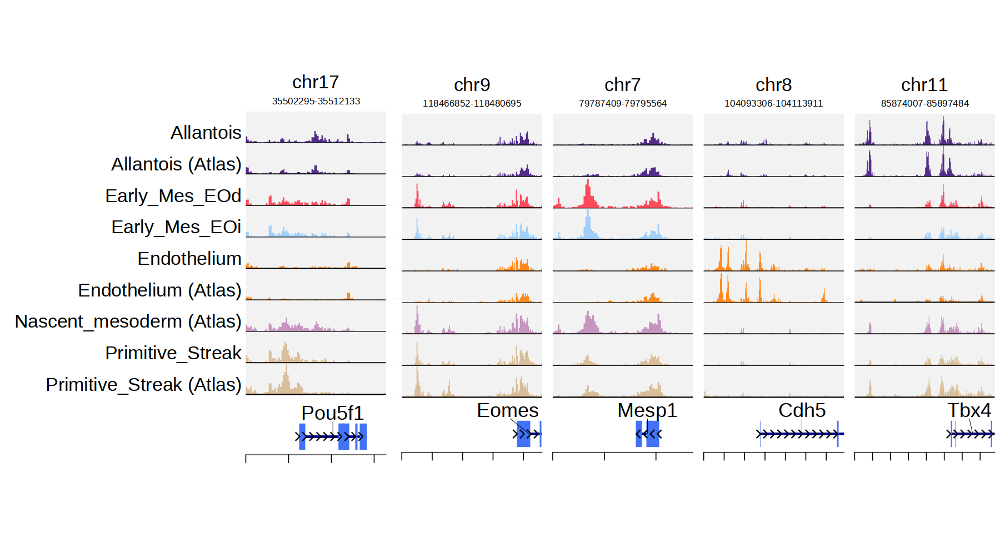

In [20]:
options(repr.plot.width = 15, repr.plot.height = 8)
patchwork::wrap_plots(plotlist = list(p1,
                                      p2,
                                      p3,
                                      p4,
                                      p5), 
                                      nrow = 1)

In [241]:
addArchRThreads(12)
earlyPeaks <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    useMatrix = "PeakMatrix", 
    groupBy = "celltype_v2",
    useGroups = 'Early_Mes_EOi', 
    bgdGroups = 'Early_Mes_EOd',
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon",
    verbose = F
)

Setting default number of Parallel threads to 12.

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-294e5c6f9b874-Date-2024-05-02_Time-16-54-28.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

Pairwise Test Early_Mes_EOi : Seqnames chr1

Pairwise Test Early_Mes_EOi : Seqnames chr10

Pairwise Test Early_Mes_EOi : Seqnames chr11

Pairwise Test Early_Mes_EOi : Seqnames chr12

Pairwise Test Early_Mes_EOi : Seqnames chr13

Pairwise Test Early_Mes_EOi : Seqnames chr14

Pairwise Test Early_Mes_EOi : Seqnames chr15

Pairwise Test Early_Mes_EOi : Seqnames chr16

Pairwise Test Early_Mes_EOi : Seqnames chr17

Pairwise Test Early_Mes_EOi : Seqnames chr18

Pairwise Test Early_Mes_EOi : Seqnames chr19

Pairwise Test Early_Mes_EOi : Seqnames chr2

Pairwise Test Early_Mes_EOi : Seqnames chr3

Pairwise Test Early_Mes_EOi : Seqnames chr4

Pairwise Test Early_Mes_EOi : Seqnames chr5

Pairwise Test Early_Mes_EOi : Seqnames chr6

Pairwise Test Early_

In [242]:
markerList <- getMarkers(earlyPeaks, cutOff = "FDR <= 0.01 & Log2FC >= 0.5")
up = as.data.table(markerList[[1]])[order(-Log2FC)]

markerList <- getMarkers(earlyPeaks, cutOff = "FDR <= 0.01 & Log2FC <= -0.5")
down = as.data.table(markerList[[1]])[order(Log2FC)]

In [247]:
bigwig_order = c('Nascent_mesoderm (Atlas)','Early_Mes_EOi','Early_Mes_EOd'
                )

WT_plot = bigwigs.data %>% copy() %>%
    .[genotype %in% c('WT', 'Atlas')] %>% 
    .[, name := ifelse(genotype=='WT', celltype, name)] %>% 
    .[, color := ifelse(genotype=='WT', opts$celltype_v2.colors[celltype], color)] %>% 
    .[match(bigwig_order, name)] %>% 
    .[, name := gsub('Haematoendothelial_progenitors', 'HE_progenitors', name)]

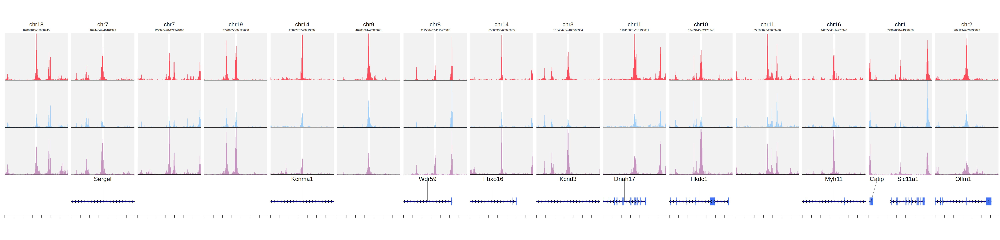

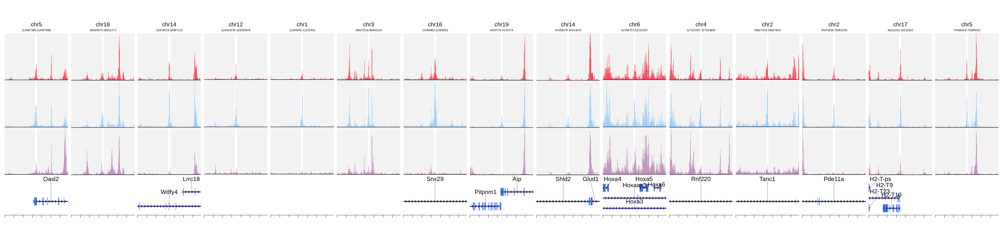

In [250]:
downsample = 1
heights = 6
gene_heights = 5
down = down[order(FDR)]

features = paste0(down$seqnames, ':', down$start, '-', down$end)[1:15]

p2 = mclapply(features, function(x){
    plot_browser_track(input_region = x, highlight_regions = x, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 1e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights)
}, mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 12)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

downsample = 1
heights = 6
gene_heights = 5
up = up[order(FDR)]
features = paste0(up$seqnames, ':', up$start, '-', up$end)[1:15]

p2 = mclapply(features, function(x){
    plot_browser_track(input_region = x, highlight_regions = x, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 1e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights)
}, mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 12)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

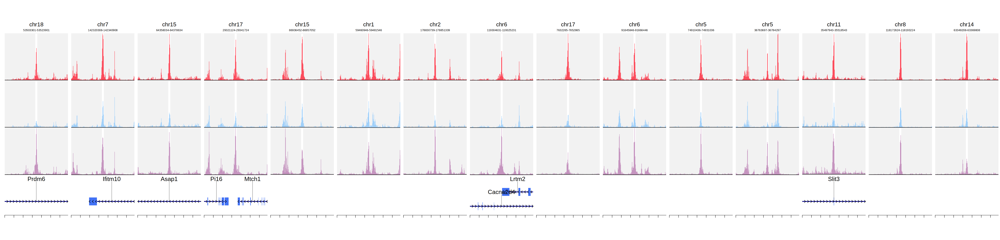

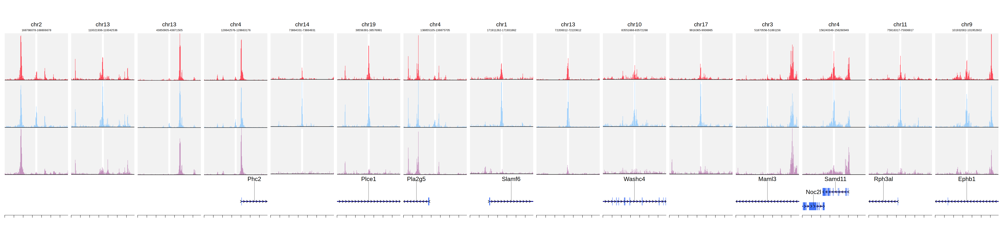

In [251]:
downsample = 1
heights = 6
gene_heights = 5
down = down[order(FDR)]

features = paste0(down$seqnames, ':', down$start, '-', down$end)[16:30]

p2 = mclapply(features, function(x){
    plot_browser_track(input_region = x, highlight_regions = x, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 1e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights)
}, mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 12)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

downsample = 1
heights = 6
gene_heights = 5
up = up[order(FDR)]
features = paste0(up$seqnames, ':', up$start, '-', up$end)[16:30]

p2 = mclapply(features, function(x){
    plot_browser_track(input_region = x, highlight_regions = x, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 1e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights)
}, mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 12)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

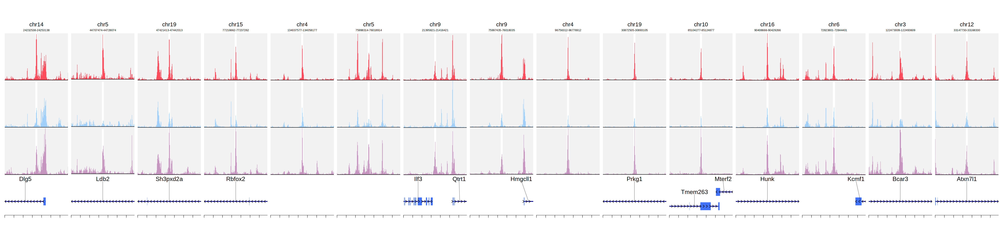

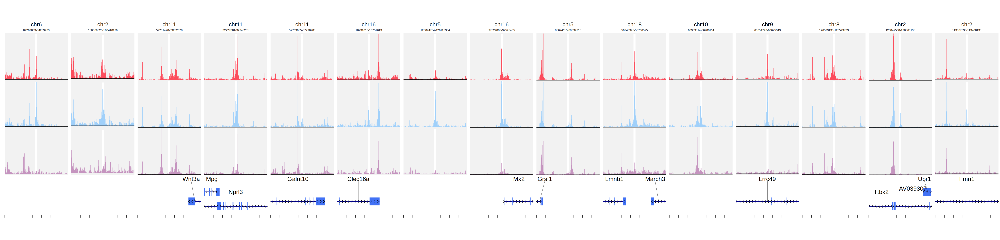

In [252]:
downsample = 1
heights = 6
gene_heights = 5
down = down[order(FDR)]

features = paste0(down$seqnames, ':', down$start, '-', down$end)[31:45]

p2 = mclapply(features, function(x){
    plot_browser_track(input_region = x, highlight_regions = x, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 1e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights)
}, mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 12)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

downsample = 1
heights = 6
gene_heights = 5
up = up[order(FDR)]
features = paste0(up$seqnames, ':', up$start, '-', up$end)[31:45]

p2 = mclapply(features, function(x){
    plot_browser_track(input_region = x, highlight_regions = x, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 1e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights)
}, mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 12)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

In [245]:
unique(meta$celltype_v2)

[1] "Early_Mes_EOd"       "Early_Mes_EOi"       "PGC"                
 [4] "Primitive_Streak"    "Posterior_Mes"       "HE_Precursor"       
 [7] "HE"                  "Mesenchyme"          "Allantois_Precursor"
[10] "Blood_Progenitor"    "Endothelium"         "Allantois"

In [219]:
addArchRThreads(16)
earlyPeaks <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    useMatrix = "PeakMatrix", 
    groupBy = "celltype_v2",
    useGroups = 'Primitive_Streak', 
    bgdGroups = c('Early_Mes_EOi', 'Early_Mes_EOd'),
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon",
    verbose = F
)

markerList <- getMarkers(earlyPeaks, cutOff = "FDR <= 0.01 & Log2FC >= 0.5")
up = as.data.table(markerList[[1]])[order(-Log2FC)] %>%
    .[,peak:=paste0(seqnames, ':',start, '-',end)]

markerList <- getMarkers(earlyPeaks, cutOff = "FDR <= 0.01 & Log2FC <= -0.5")
down = as.data.table(markerList[[1]])[order(Log2FC)] %>%
    .[,peak:=paste0(seqnames, ':',start, '-',end)]

Setting default number of Parallel threads to 16.

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-294e5c27772777-Date-2024-05-02_Time-15-52-50.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

Pairwise Test Primitive_Streak : Seqnames chr1

Pairwise Test Primitive_Streak : Seqnames chr10

Pairwise Test Primitive_Streak : Seqnames chr11

Pairwise Test Primitive_Streak : Seqnames chr12

Pairwise Test Primitive_Streak : Seqnames chr13

Pairwise Test Primitive_Streak : Seqnames chr14

Pairwise Test Primitive_Streak : Seqnames chr15

Pairwise Test Primitive_Streak : Seqnames chr16

Pairwise Test Primitive_Streak : Seqnames chr17

Pairwise Test Primitive_Streak : Seqnames chr18

Pairwise Test Primitive_Streak : Seqnames chr19

Pairwise Test Primitive_Streak : Seqnames chr2

Pairwise Test Primitive_Streak : Seqnames chr3

Pairwise Test Primitive_Streak : Seqnames chr4

Pairwise Test Primitive_Streak : Seqnames chr5

Pairwise Test Primi

In [220]:
bigwig_order = c('Primitive_Streak', 'Early_Mes_EOi','Early_Mes_EOd'
                )

WT_plot = bigwigs.data %>% copy() %>%
    .[genotype %in% c('WT', 'Atlas')] %>% 
    .[, name := ifelse(genotype=='WT', celltype, name)] %>% 
    .[, color := ifelse(genotype=='WT', opts$celltype_v2.colors[celltype], color)] %>% 
    .[match(bigwig_order, name)] %>% 
    .[, name := gsub('Haematoendothelial_progenitors', 'HE_progenitors', name)]

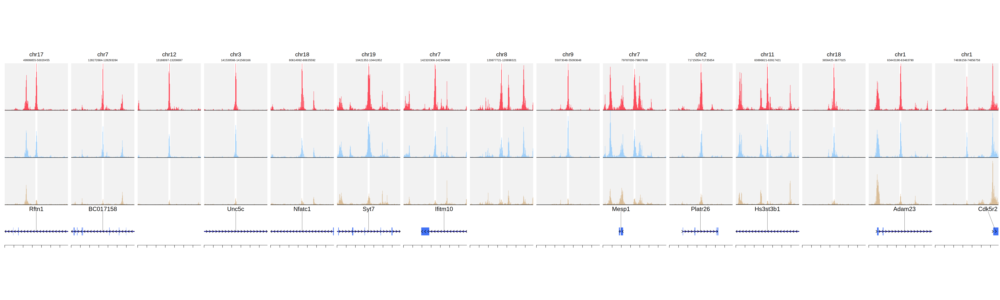

In [239]:
downsample = 1
heights = 6
gene_heights = 5
down = down[order(FDR)]

features = paste0(down$seqnames, ':', down$start, '-', down$end)[1:15]

#p1 = plot_browser_track(gene = 'Gjb3', input_region = NULL, bigwigs = WT_plot, extend.upstream = 1000, extend.downstream = 1000, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p2 = mclapply(features, function(x){
    plot_browser_track(input_region = x, highlight_regions = x, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 1e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights)
}, mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 15)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

downsample = 1
heights = 6
gene_heights = 5
up = up[order(FDR)]
features = paste0(up$seqnames, ':', up$start, '-', up$end)[1:15]

#p1 = plot_browser_track(gene = 'Gjb3', input_region = NULL, bigwigs = WT_plot, extend.upstream = 1000, extend.downstream = 1000, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p2 = mclapply(features, function(x){
    plot_browser_track(input_region = x, highlight_regions = x, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 1e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights)
}, mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 15)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

In [254]:
unique(ArchRProject@cellColData$celltypeV2_genotype)

[1] "Early_Mes_EOd-WT"       "Early_Mes_EOi-WT"       "PGC-WT"                
 [4] "Primitive_Streak-WT"    "Posterior_Mes-WT"       "HE_Precursor-WT"       
 [7] "HE-WT"                  "Mesenchyme-WT"          "Early_Mes_EOi-KO"      
[10] "Primitive_Streak-KO"    "PGC-KO"                 "Early_Mes_EOd-KO"      
[13] "Mesenchyme-KO"          "Posterior_Mes-KO"       "HE_Precursor-KO"       
[16] "HE-KO"                  "Allantois_Precursor-WT" "Blood_Progenitor-WT"   
[19] "Endothelium-WT"         "Allantois_Precursor-KO" "Endothelium-KO"        
[22] "Allantois-WT"           "Allantois-KO"           "Blood_Progenitor-KO"

In [280]:
addArchRThreads(16)
earlyPeaks <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    useMatrix = "PeakMatrix", 
    groupBy = "celltypeV2_genotype",
    useGroups = 'Early_Mes_EOi-KO', 
    bgdGroups = 'Early_Mes_EOi-WT',
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon",
    maxCells = 1e10,
    verbose = F
)


Setting default number of Parallel threads to 16.

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-294e5c46778b3c-Date-2024-05-02_Time-17-45-35.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

Pairwise Test Early_Mes_EOi-KO : Seqnames chr1

Pairwise Test Early_Mes_EOi-KO : Seqnames chr10

Pairwise Test Early_Mes_EOi-KO : Seqnames chr11

Pairwise Test Early_Mes_EOi-KO : Seqnames chr12

Pairwise Test Early_Mes_EOi-KO : Seqnames chr13

Pairwise Test Early_Mes_EOi-KO : Seqnames chr14

Pairwise Test Early_Mes_EOi-KO : Seqnames chr15

Pairwise Test Early_Mes_EOi-KO : Seqnames chr16

Pairwise Test Early_Mes_EOi-KO : Seqnames chr17

Pairwise Test Early_Mes_EOi-KO : Seqnames chr18

Pairwise Test Early_Mes_EOi-KO : Seqnames chr19

Pairwise Test Early_Mes_EOi-KO : Seqnames chr2

Pairwise Test Early_Mes_EOi-KO : Seqnames chr3

Pairwise Test Early_Mes_EOi-KO : Seqnames chr4

Pairwise Test Early_Mes_EOi-KO : Seqnames chr5

Pairwise Test Early

In [282]:

markerList <- getMarkers(earlyPeaks, cutOff = "FDR <= 0.05 & Log2FC >= 0.25")
up = as.data.table(markerList[[1]])[order(-Log2FC)] %>%
    .[,peak:=paste0(seqnames, ':',start, '-',end)]

markerList <- getMarkers(earlyPeaks, cutOff = "FDR <= 0.05 & Log2FC <= -0.25")
down = as.data.table(markerList[[1]])[order(Log2FC)] %>%
    .[,peak:=paste0(seqnames, ':',start, '-',end)]

In [283]:
nrow(up)
nrow(down)

[1] 576

[1] 407

In [284]:
bigwig_order = c('Nascent_mesoderm (Atlas)','Early_Mes_EOi-WT','Early_Mes_EOi-KO'
                )

WT_plot = bigwigs.data %>% copy() %>%
    .[match(bigwig_order, name)]

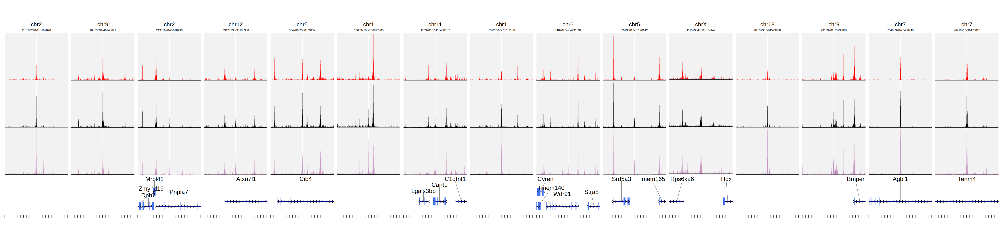

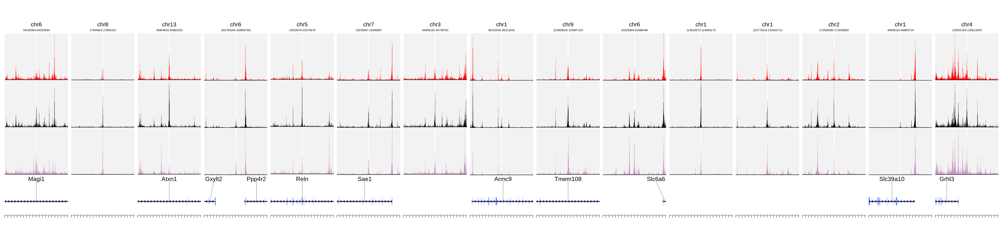

In [285]:
downsample = 1
heights = 6
gene_heights = 5
down = down[order(FDR)]

features = paste0(down$seqnames, ':', down$start, '-', down$end)[1:15]

p2 = mclapply(features, function(x){
    plot_browser_track(input_region = x, highlight_regions = x, bigwigs = WT_plot, extend.upstream = 3e4, extend.downstream = 3e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights)
}, mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 12)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

features = paste0(down$seqnames, ':', down$start, '-', down$end)[16:30]

p2 = mclapply(features, function(x){
    plot_browser_track(input_region = x, highlight_regions = x, bigwigs = WT_plot, extend.upstream = 3e4, extend.downstream = 3e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights)
}, mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 12)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

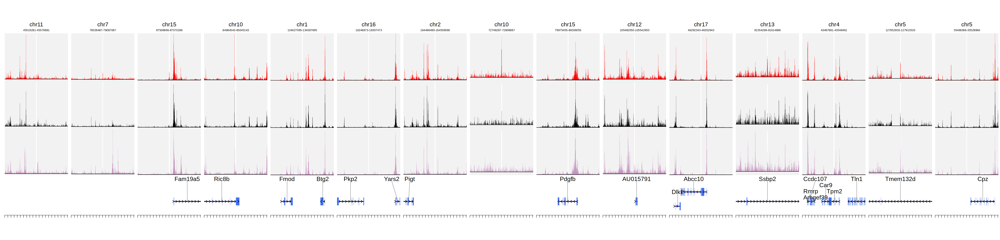

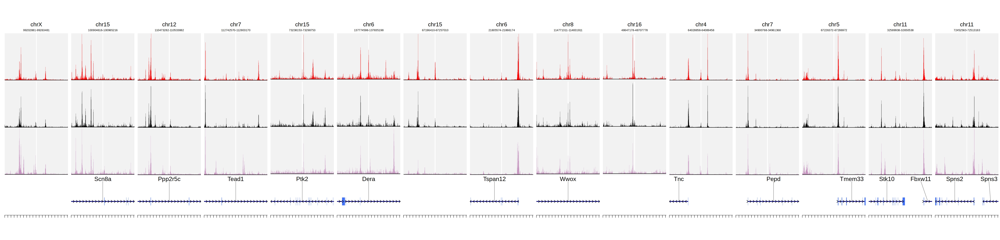

In [287]:
features = paste0(up$seqnames, ':', up$start, '-', up$end)[1:15]

p2 = mclapply(features, function(x){
    plot_browser_track(input_region = x, highlight_regions = x, bigwigs = WT_plot, extend.upstream = 3e4, extend.downstream = 3e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights)
}, mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 12)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

features = paste0(up$seqnames, ':', up$start, '-', up$end)[16:30]

p2 = mclapply(features, function(x){
    plot_browser_track(input_region = x, highlight_regions = x, bigwigs = WT_plot, extend.upstream = 3e4, extend.downstream = 3e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights)
}, mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 12)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

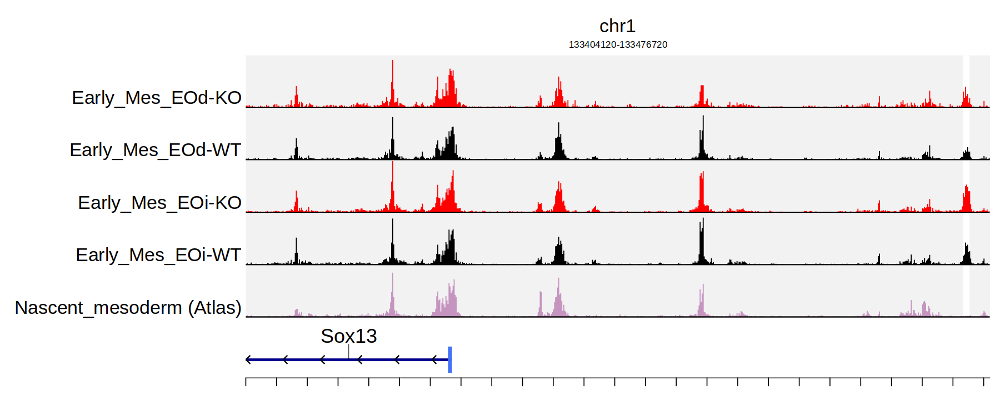

In [289]:
bigwig_order = c('Nascent_mesoderm (Atlas)','Early_Mes_EOi-WT','Early_Mes_EOi-KO','Early_Mes_EOd-WT','Early_Mes_EOd-KO'
                )

WT_plot = bigwigs.data %>% copy() %>%
    .[match(bigwig_order, name)]

options(repr.plot.width = 15, repr.plot.height = 6)
#WT_plot = WT_plot[1:2]
downsample = 1
heights = 2
gene_heights = 2

regions = 'chr1:133474120-133474720'
p1 = plot_browser_track(gene = NULL, input_region = regions, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 70000, extend.downstream = 2000, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1

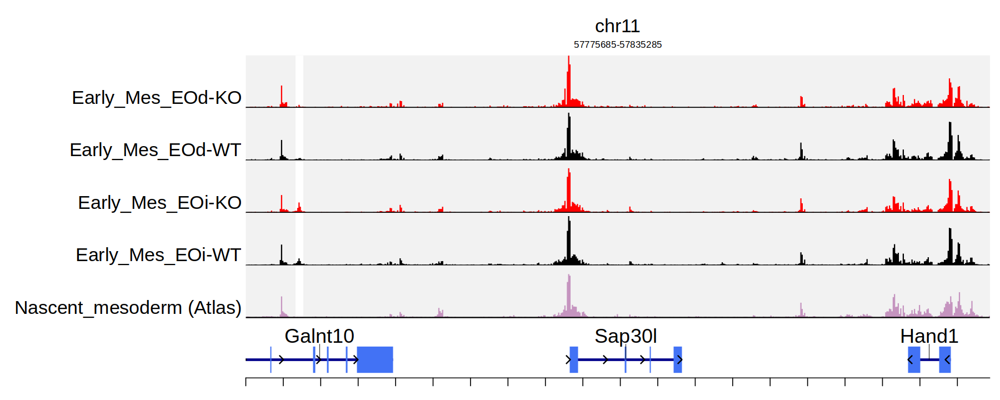

In [290]:
options(repr.plot.width = 15, repr.plot.height = 6)
#WT_plot = WT_plot[1:2]
downsample = 1
heights = 2
gene_heights = 2

regions = 'chr11:57779685-57780285'
p1 = plot_browser_track(gene = NULL, input_region = regions, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 4000, extend.downstream = 55000, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1

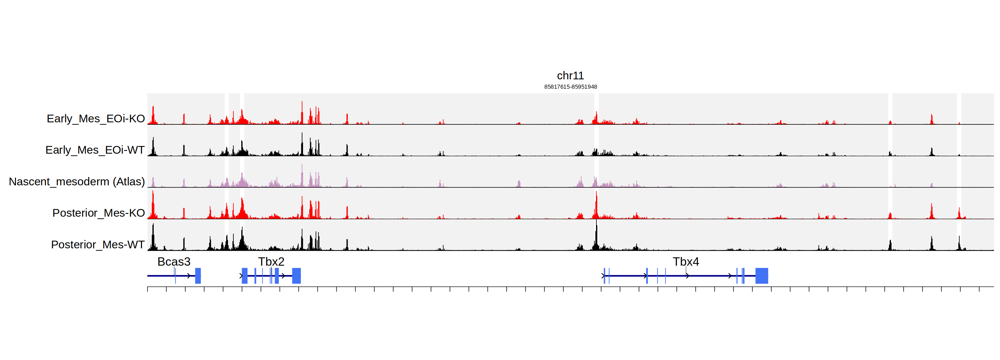

In [291]:
bigwig_order = c('Nascent_mesoderm (Atlas)','Early_Mes_EOi-WT','Early_Mes_EOi-KO','Posterior_Mes-WT', 'Posterior_Mes-KO'
                )

WT_plot = bigwigs.data %>% copy() %>%
    .[match(bigwig_order, name)]


options(repr.plot.width = 25, repr.plot.height = 9)
#WT_plot = WT_plot[1:2]
downsample = 1
heights = 2
gene_heights = 2

regions = c('chr11:85935193-85935793', 'chr11:85935193-85935793', 'chr11:85829869-85830469', 'chr11:85829869-85830469', 'chr11:85888571-85889171', 'chr11:85888571-85889171', 'chr11:85734184-85734784', 'chr11:85832337-85832937', 'chr11:85832337-85832937', 'chr11:85799743-85800343', 'chr11:85799743-85800343', 'chr11:85946133-85946733', 'chr11:85946133-85946733')
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Tbx2', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 15000, extend.downstream = 1.1e5, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

In [298]:
head(down$peak)

[1] "chr2:115132220-115132820" "chr9:46913091-46913691"  
[3] "chr2:24987698-24988298"   "chr12:33157730-33158330" 
[5] "chr5:30508852-30509452"   "chr1:106067285-106067885"

In [300]:
highlight_regions = regions =  c(up$peak, down$peak)
gene = 'Dlk1'
extend.upstream = 1.5e4
extend.downstream = 6e4
# Get region around gene
        region = ArchRProject@geneAnnotation$genes[grep(paste0('^', gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
        start(ranges(region)) = start(ranges(region)) - extend.upstream
        end(ranges(region)) = end(ranges(region)) + extend.downstream
        gr <- GRanges(c(seqnames(region)), IRanges(start=start(ranges(region)), end=end(ranges(region))), strand='+')

# Keep only highlights in the display range
        highlights = GRanges(c(str_split(highlight_regions, ':') %>% map_chr(1)), 
                      IRanges(start=as.numeric(str_split(str_split(highlight_regions, ':') %>% map_chr(2), '-') %>% map_chr(1)), 
                              end=as.numeric(str_split(str_split(highlight_regions, ':') %>% map_chr(2), '-') %>% map_chr(2))), 
                        strand='+')
        
        highlight_in_region = findOverlaps(highlights, gr, ignore.strand = T, type = 'within')
        highlight_regions = highlight_regions[queryHits(highlight_in_region)]

In [302]:
length(highlight_regions)

[1] 0

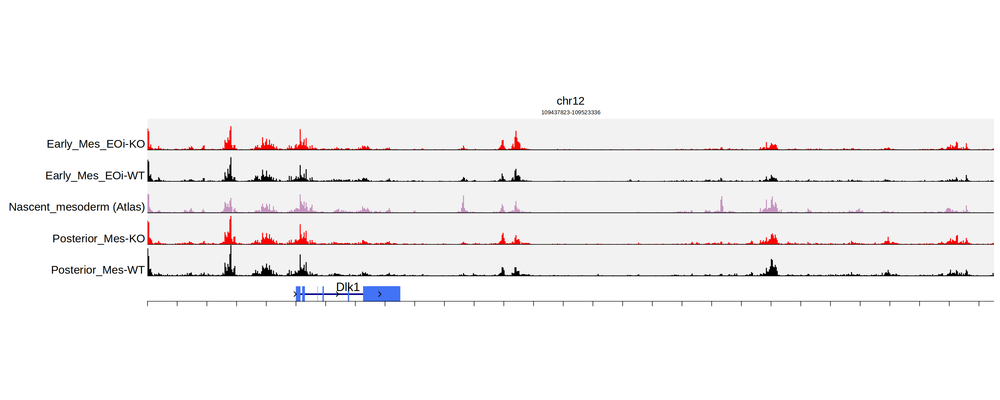

In [305]:
options(repr.plot.width = 25, repr.plot.height = 10)
#WT_plot = WT_plot[1:2]
downsample = 1
heights = 2
gene_heights = 1.3

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Dlk1', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 1.5e4, extend.downstream = 6e4, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

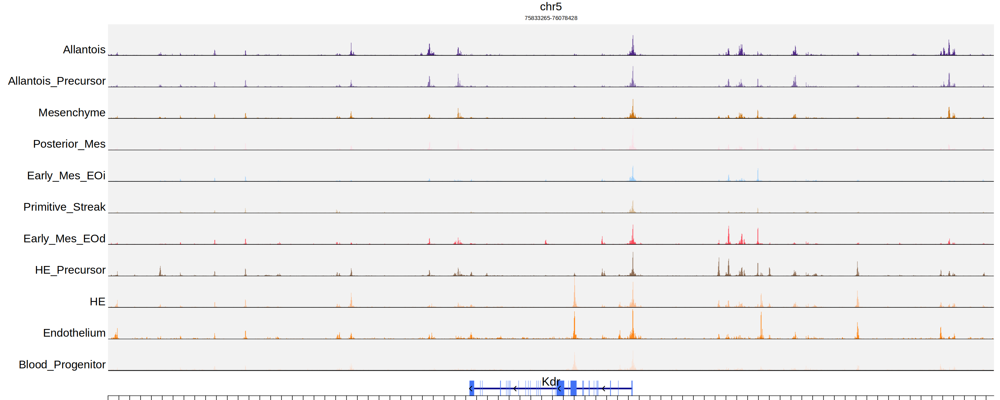

In [307]:
bigwig_order = opts$celltype_levels2

WT_plot = bigwigs.data %>% copy() %>%
    .[genotype %in% c('WT', 'Atlas')] %>% 
    .[, name := ifelse(genotype=='WT', celltype, name)] %>% 
    .[, color := ifelse(genotype=='WT', opts$celltype_v2.colors[celltype], color)] %>% 
    .[match(bigwig_order, name)] %>% 
    .[, name := factor(name, levels = bigwig_order)]

options(repr.plot.width = 25, repr.plot.height = 10)
#WT_plot = WT_plot[1:2]
downsample = 1
heights = 2
gene_heights = 1.3

p1 = plot_browser_track(gene = 'Kdr', input_region = NULL, highlight_regions = NULL, bigwigs = WT_plot, extend.upstream = 1e5, extend.downstream = 1e5, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1

In [ ]:
options(repr.plot.width = 25, repr.plot.height = 10)
#WT_plot = WT_plot[1:2]
downsample = 1
heights = 2
gene_heights = 1.3

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Kdr', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 1.5e5, extend.downstream = 1.3e5, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


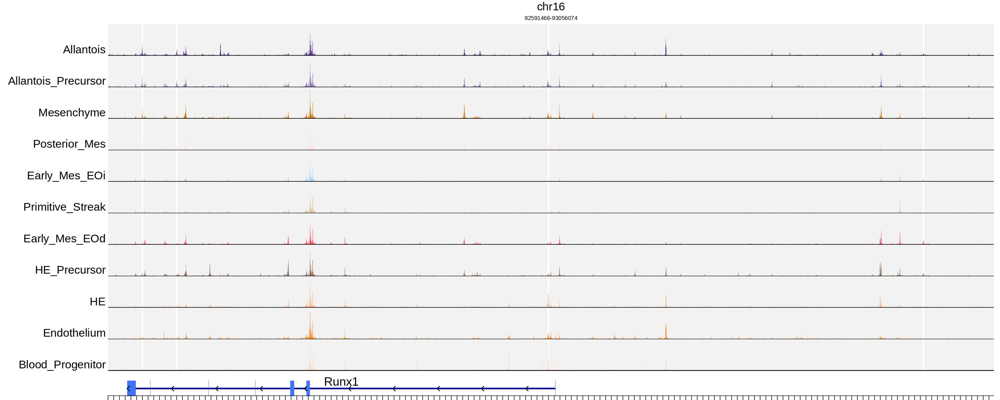

In [182]:
options(repr.plot.width = 25, repr.plot.height = 10)
#WT_plot = WT_plot[1:2]
downsample = 1
heights = 2
gene_heights = 1.3

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Runx1', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 2.3e5, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

In [257]:
downsample = 1

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


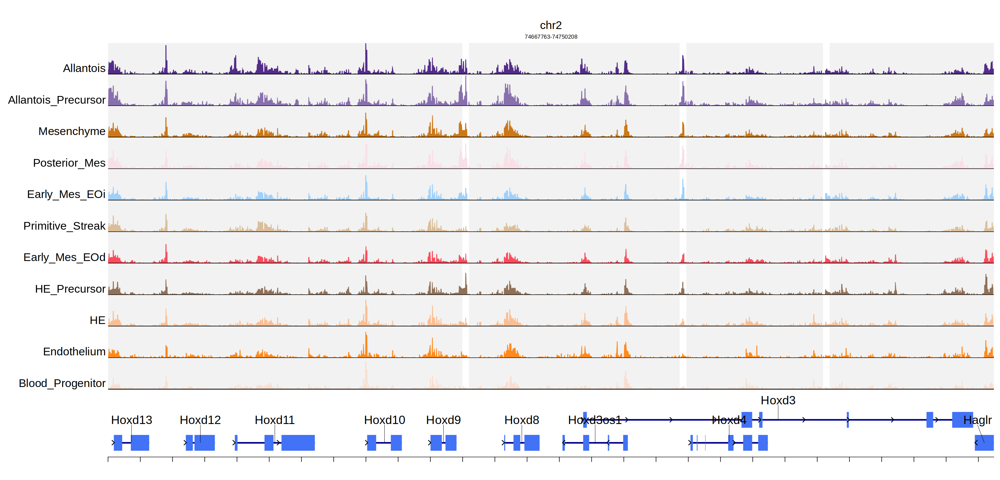

In [258]:
options(repr.plot.width = 25, repr.plot.height = 12)
#WT_plot = WT_plot[1:2]
heights = 2
gene_heights = 4

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Hoxd9', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 3e4, extend.downstream = 5e4, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


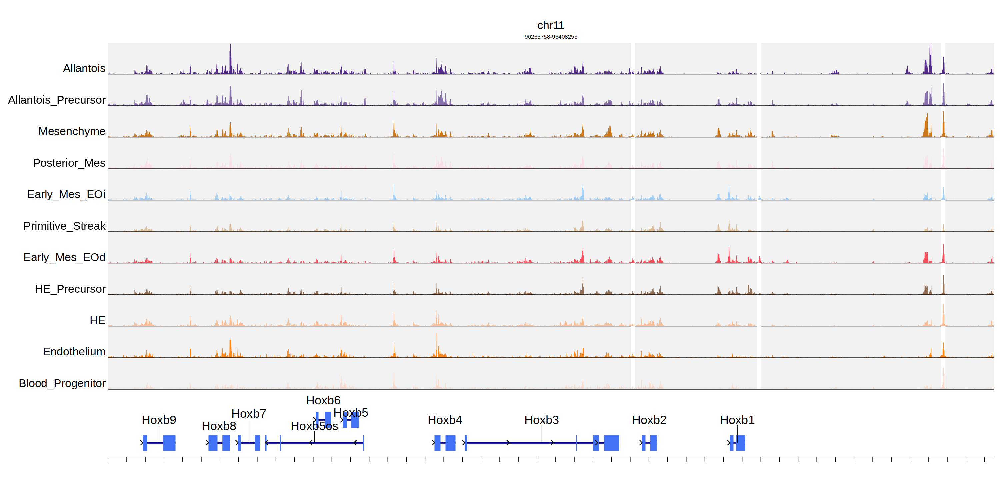

In [259]:
options(repr.plot.width = 25, repr.plot.height = 12)
#WT_plot = WT_plot[1:2]
heights = 2
gene_heights = 4

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Hoxb1', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 1e5, extend.downstream = 4e4, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


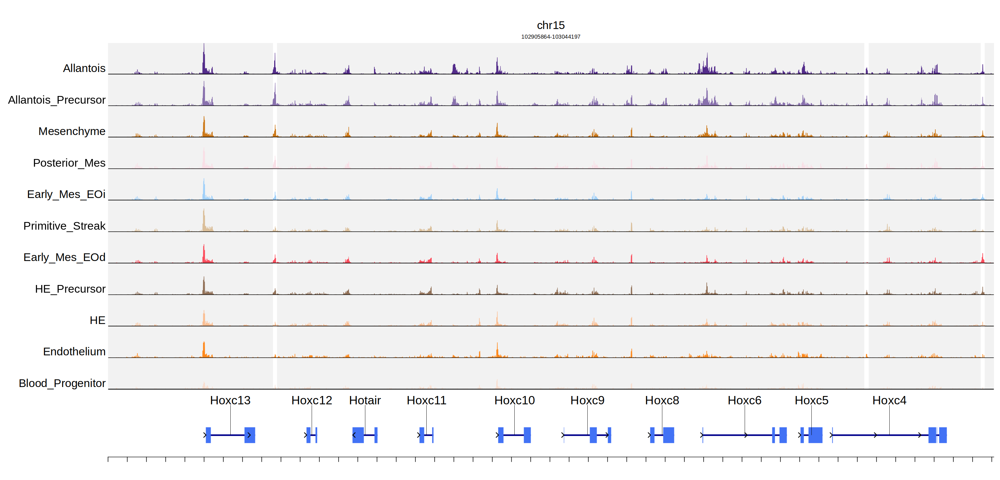

In [260]:
options(repr.plot.width = 25, repr.plot.height = 12)
#WT_plot = WT_plot[1:2]
heights = 2
gene_heights = 4

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = NULL, input_region = 'chr15:102906864-103039197', highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 1e3, extend.downstream = 5e3, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


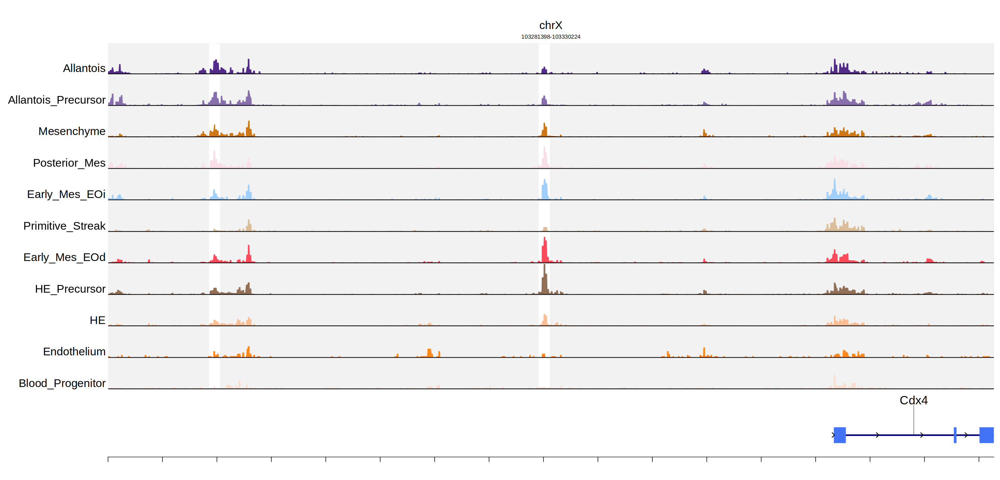

In [261]:
options(repr.plot.width = 25, repr.plot.height = 12)
#WT_plot = WT_plot[1:2]
heights = 2
gene_heights = 4

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Cdx4', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 4e4, extend.downstream = 0, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


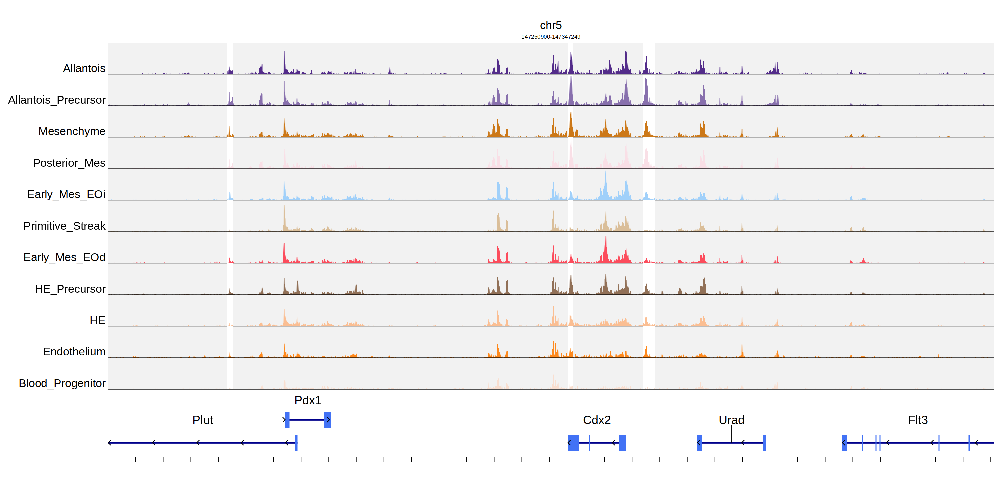

In [262]:
options(repr.plot.width = 25, repr.plot.height = 12)
#WT_plot = WT_plot[1:2]
heights = 2
gene_heights = 4

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Cdx2', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 5e4, extend.downstream = 4e4, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


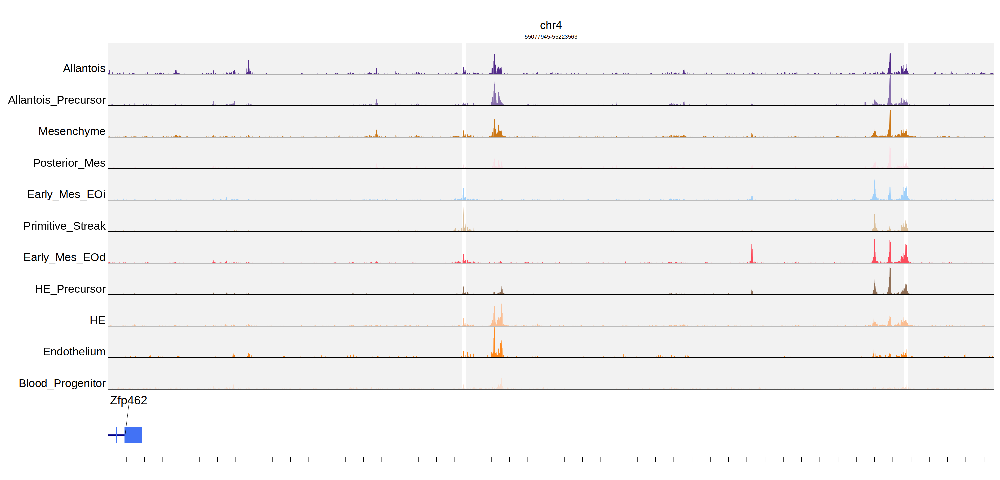

In [263]:
options(repr.plot.width = 25, repr.plot.height = 12)
#WT_plot = WT_plot[1:2]
heights = 2
gene_heights = 4

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Zfp462', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = -1.3e5, extend.downstream = 1.4e5, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


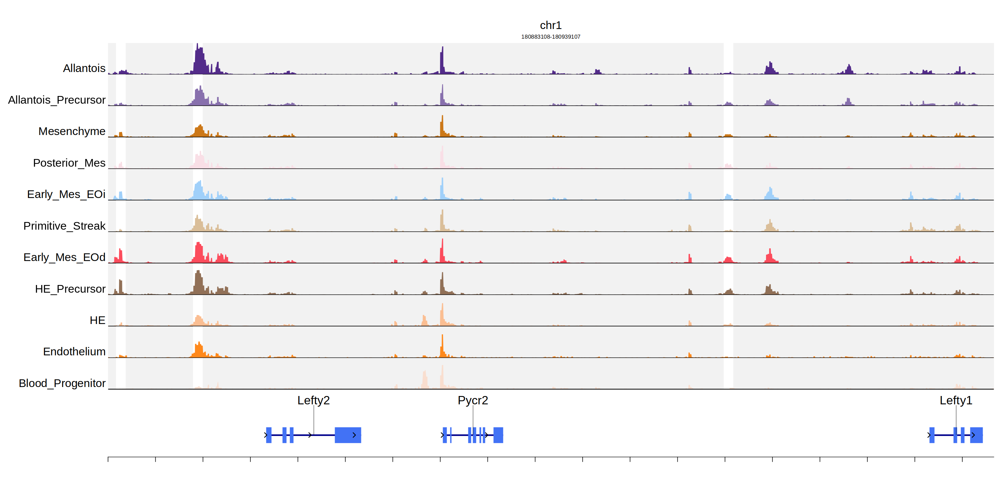

In [264]:
options(repr.plot.width = 25, repr.plot.height = 12)
#WT_plot = WT_plot[1:2]
heights = 2
gene_heights = 4

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Lefty2', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 4e4, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


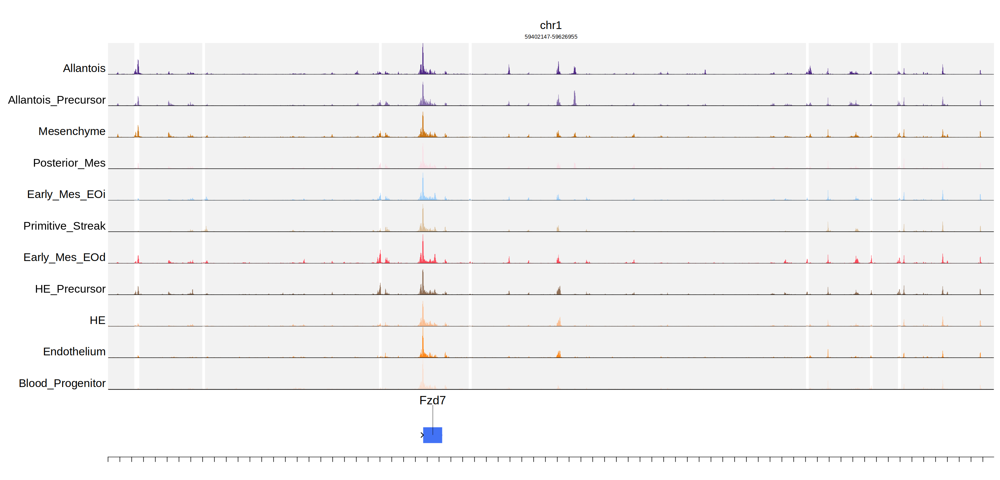

In [265]:
options(repr.plot.width = 25, repr.plot.height = 12)
#WT_plot = WT_plot[1:2]
heights = 2
gene_heights = 4

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Fzd7', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 8e4, extend.downstream = 1.4e5, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


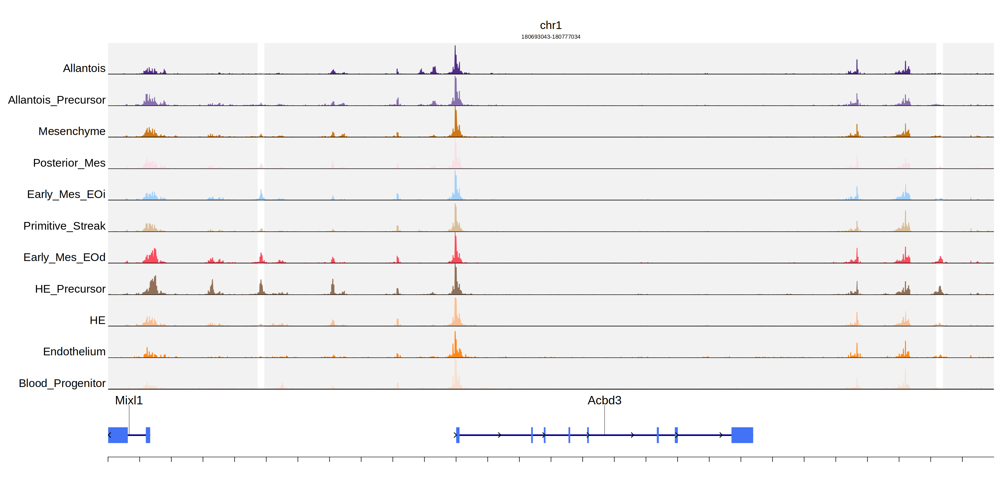

In [266]:
options(repr.plot.width = 25, repr.plot.height = 12)
#WT_plot = WT_plot[1:2]
heights = 2
gene_heights = 4

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Mixl1', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 0, extend.downstream = 8e4, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


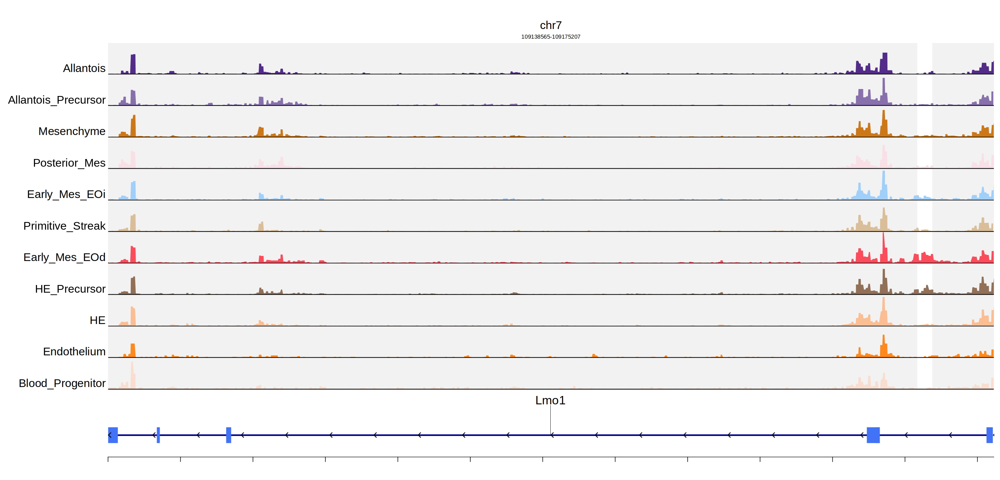

In [267]:
options(repr.plot.width = 25, repr.plot.height = 12)
#WT_plot = WT_plot[1:2]
heights = 2
gene_heights = 4

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Lmo1', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 0, extend.downstream = 0, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


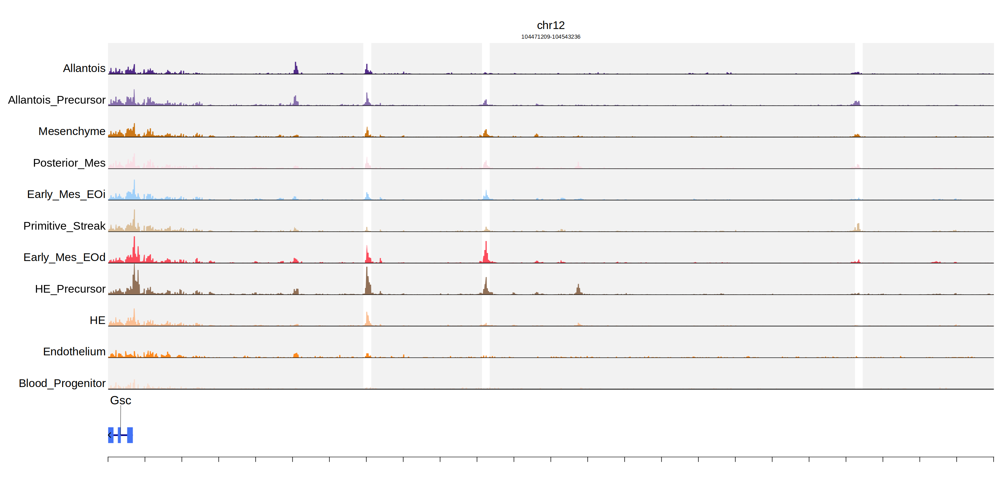

In [268]:
options(repr.plot.width = 25, repr.plot.height = 12)
#WT_plot = WT_plot[1:2]
heights = 2
gene_heights = 4

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Gsc', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 0, extend.downstream = 7e4, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

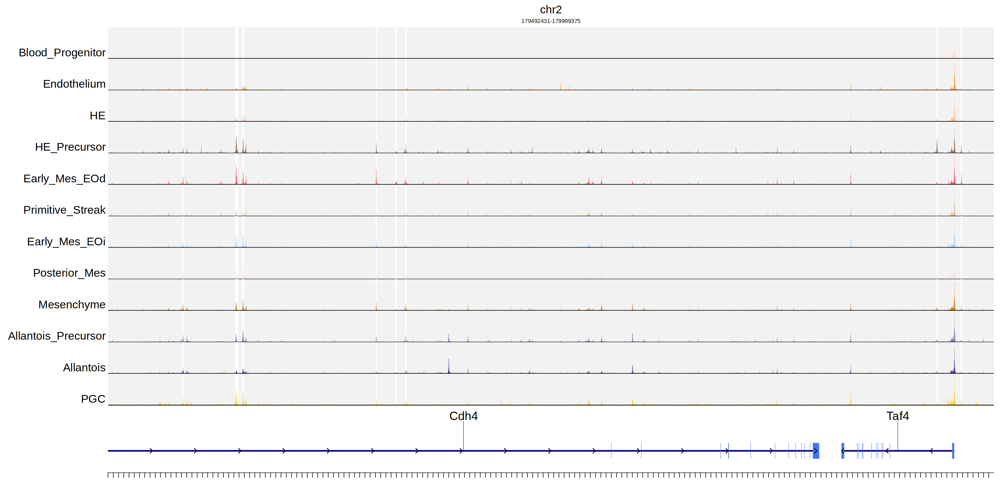

In [208]:
options(repr.plot.width = 25, repr.plot.height = 12)
#WT_plot = WT_plot[1:2]
heights = 2
gene_heights = 4

regions =  c(up$peak, down$peak)
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Cdh4', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = -5e4, extend.downstream = 1e5, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


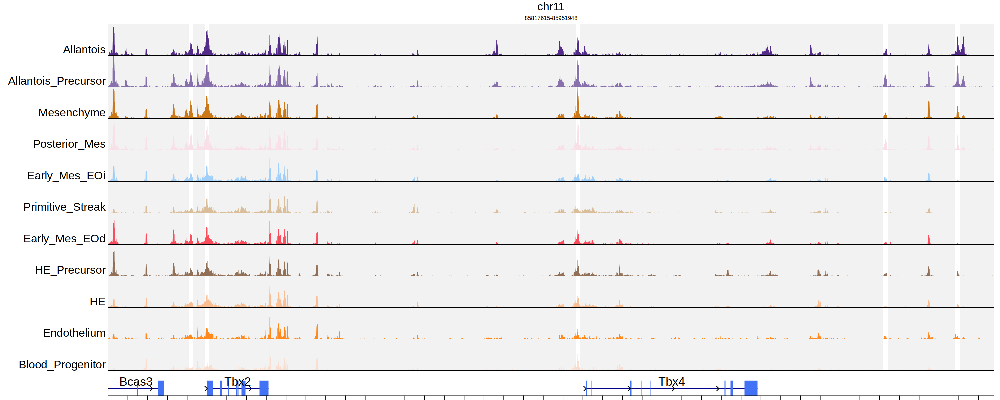

In [158]:
bigwig_order = c('Allantois',
                 'Allantois_Precursor',
                 'Mesenchyme',
                 'Posterior_Mes',
                 'Early_Mes_EOi',
                 'Primitive_Streak',
                 'Early_Mes_EOd',
                 'HE_Precursor',
                 'HE',
                 'Endothelium',
                 'Blood_Progenitor'
                )

WT_plot = bigwigs.data %>% copy() %>%
    .[genotype %in% c('WT', 'Atlas')] %>% 
    .[, name := ifelse(genotype=='WT', celltype, name)] %>% 
    .[, color := ifelse(genotype=='WT', opts$celltype_v2.colors[celltype], color)] %>% 
    .[match(bigwig_order, name)] %>% 
    .[,name:=factor(name, levels=bigwig_order)]

options(repr.plot.width = 25, repr.plot.height = 10)
#WT_plot = WT_plot[1:2]
downsample = 1
heights = 2
gene_heights = 1.3

regions = c('chr11:85935193-85935793', 'chr11:85935193-85935793', 'chr11:85829869-85830469', 'chr11:85829869-85830469', 'chr11:85888571-85889171', 'chr11:85888571-85889171', 'chr11:85734184-85734784', 'chr11:85832337-85832937', 'chr11:85832337-85832937', 'chr11:85799743-85800343', 'chr11:85799743-85800343', 'chr11:85946133-85946733', 'chr11:85946133-85946733')
#pdf('test.pdf', width = 30, height = 15)
p1 = plot_browser_track(gene = 'Tbx2', input_region = NULL, highlight_regions = regions, bigwigs = WT_plot, extend.upstream = 15000, extend.downstream = 1.1e5, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p1
#dev.off()

In [192]:
bigwig_order

[1] "PGC"                 "Allantois"           "Allantois_Precursor"
 [4] "Mesenchyme"          "Posterior_Mes"       "Early_Mes_EOi"      
 [7] "Primitive_Streak"    "Early_Mes_EOd"       "HE_Precursor"       
[10] "HE"                  "Endothelium"         "Blood_Progenitor"

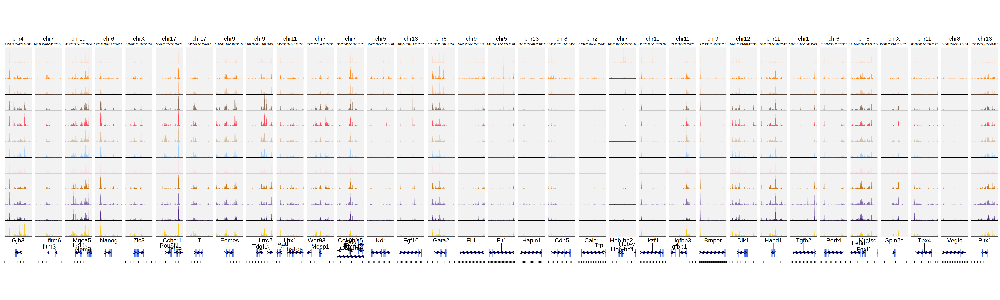

In [204]:
bigwig_order = names(opts$celltype_v2.colors)

WT_plot = bigwigs.data %>% copy() %>%
    .[genotype %in% c('WT', 'Atlas')] %>% 
    .[, name := ifelse(genotype=='WT', celltype, name)] %>% 
    .[, color := ifelse(genotype=='WT', opts$celltype_v2.colors[celltype], color)] %>% 
    .[match(bigwig_order, name)] %>% 
    .[,name := factor(name, levels = rev(bigwig_order))] %>%
    .[order(name)]

features = c('Gjb3', 'Ifitm3', 'Fgf8',  # PGC
             'Nanog', 'Zic3', 'Pou5f1', 'T', #PS
             'Eomes', 'Tdgf1', 'Lhx1', 'Mesp1', #Early Mes 1
             'Etv2', 'Kdr', 'Fgf10', # HE Pre
             'Gata2', 'Fli1', 'Flt1', 'Hapln1', # HE
             'Cdh5', 'Calcrl', #'Tek', # Endo
             'Hbb-bh1', 'Ikzf1', # Blood P
             'Igfbp3', 'Bmper', # Early Mes 2 --> search for other markers?
             'Dlk1', 'Hand1', 'Tgfb2',# Post Mes
             'Podxl', 'Foxf1', # Mesenchyme
             'Spin2c',
             'Tbx4', 'Vegfc', 'Pitx1' # Allantois
             )

downsample = 1
heights = 2
gene_heights = 3

#p1 = plot_browser_track(gene = 'Gjb3', input_region = NULL, bigwigs = WT_plot, extend.upstream = 1000, extend.downstream = 1000, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p2 = mclapply(features, plot_browser_track, input_region = NULL, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 1e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights,
             mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 15)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

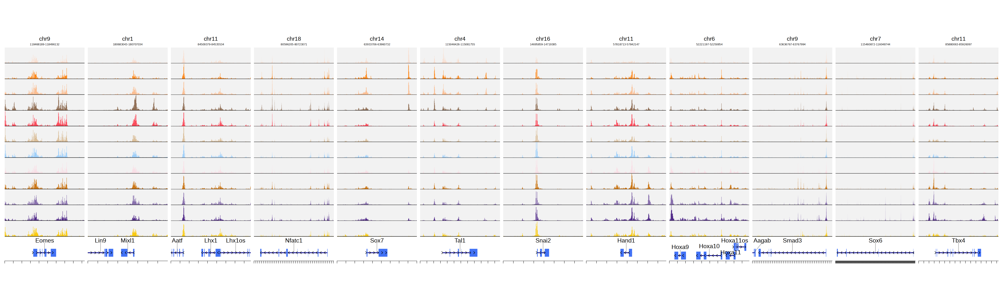

In [21]:
bigwig_order = names(opts$celltype_v2.colors)

WT_plot = bigwigs.data %>% copy() %>%
    .[genotype %in% c('WT', 'Atlas')] %>% 
    .[, name := ifelse(genotype=='WT', celltype, name)] %>% 
    .[, color := ifelse(genotype=='WT', opts$celltype_v2.colors[celltype], color)] %>% 
    .[match(bigwig_order, name)] %>% 
    .[,name := factor(name, levels = rev(bigwig_order))] %>%
    .[order(name)]

features = c('Eomes', 'Mixl1', 'Lhx1', 'Nfatc1', 'Sox7', 'Tal1',
          'Snai2', 'Hand1', 'Hoxa10',  'Smad3','Sox6', 'Tbx4')

downsample = 1
heights = 2
gene_heights = 3

#p1 = plot_browser_track(gene = 'Gjb3', input_region = NULL, bigwigs = WT_plot, extend.upstream = 1000, extend.downstream = 1000, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p2 = mclapply(features, plot_browser_track, input_region = NULL, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 1e4, downsample.rate = downsample,no_label = T, bw_height = heights, gene_height=gene_heights,
             mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 15)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

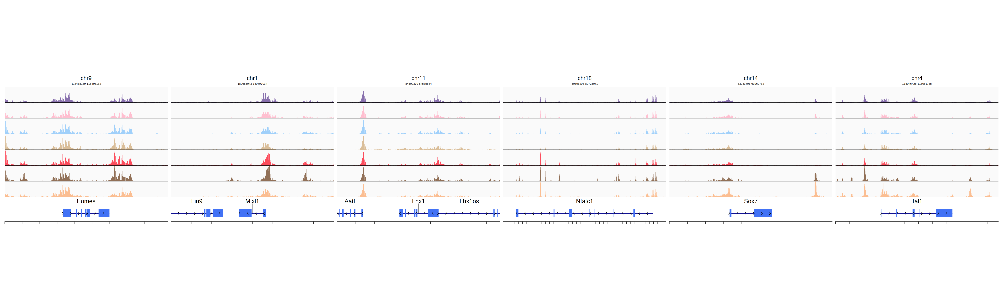

In [42]:
bigwig_order = c('HE','HE_Precursor','Early_Mes_EOd',
                'Primitive_Streak',
                'Early_Mes_EOi','Posterior_Mes','Allantois_Precursor')

WT_plot = bigwigs.data %>% copy() %>%
    .[genotype %in% c('WT', 'Atlas')] %>% 
    .[, name := ifelse(genotype=='WT', celltype, name)] %>% 
    .[, color := ifelse(genotype=='WT', opts$celltype_v2.colors[celltype], color)] %>% 
    .[match(bigwig_order, name)] %>% 
    .[,name := factor(name, levels = rev(bigwig_order))] %>%
    .[order(name)]

features = c('Eomes', 'Mixl1', 'Lhx1', 'Nfatc1', 'Sox7', 'Tal1')#,
         # 'Snai2', 'Hand1', 'Hoxa10',  'Smad3', 'Tbx4')
downsample = 1
heights = 2
gene_heights = 3

#p1 = plot_browser_track(gene = 'Gjb3', input_region = NULL, bigwigs = WT_plot, extend.upstream = 1000, extend.downstream = 1000, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p2 = mclapply(features, plot_browser_track, input_region = NULL, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 1e4, downsample.rate = downsample,no_label = T, background_color = 'grey98', bw_height = heights, gene_height=gene_heights,
             mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 15)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

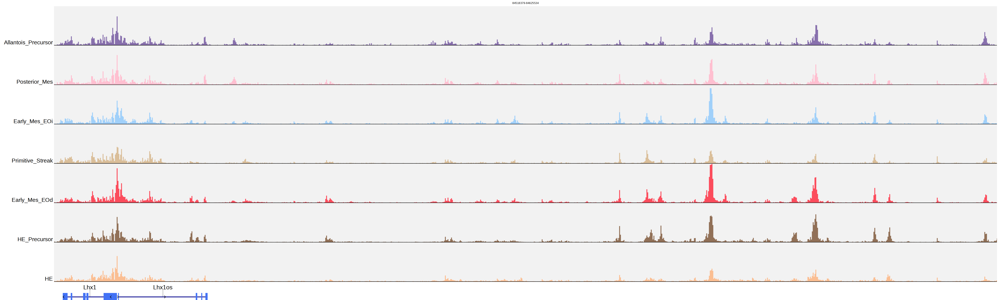

In [49]:
plot_browser_track('Lhx1', bigwigs = WT_plot,  extend.upstream = 1e3, extend.downstream = 1e5, downsample.rate = 1, bw_height = 5)

In [ ]:
bigwig_order = c('HE','HE_Precursor','Early_Mes_EOd',
                'Primitive_Streak',
                'Early_Mes_EOi','Posterior_Mes','Allantois_Precursor')

WT_plot = bigwigs.data %>% copy() %>%
    .[genotype %in% c('WT', 'Atlas')] %>% 
    .[, name := ifelse(genotype=='WT', celltype, name)] %>% 
    .[, color := ifelse(genotype=='WT', opts$celltype_v2.colors[celltype], color)] %>% 
    .[match(bigwig_order, name)] %>% 
    .[,name := factor(name, levels = rev(bigwig_order))] %>%
    .[order(name)]

features = c('Notch1','Fzd7',  'Frzb', 'Fgf10','Vegfc', 'Kdr','Bmp2','Tdgf1', 'Tgfbr3','Lefty2')
downsample = 1
heights = 2
gene_heights = 3

#p1 = plot_browser_track(gene = 'Gjb3', input_region = NULL, bigwigs = WT_plot, extend.upstream = 1000, extend.downstream = 1000, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)
p2 = mclapply(features, plot_browser_track, input_region = NULL, bigwigs = WT_plot, extend.upstream = 1e4, extend.downstream = 1e4, downsample.rate = downsample,no_label = T, background_color = 'grey90', bw_height = heights, gene_height=gene_heights,
             mc.cores = 12)
options(repr.plot.width = 50, repr.plot.height = 15)
patchwork::wrap_plots(plotlist = p2, nrow = 1)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


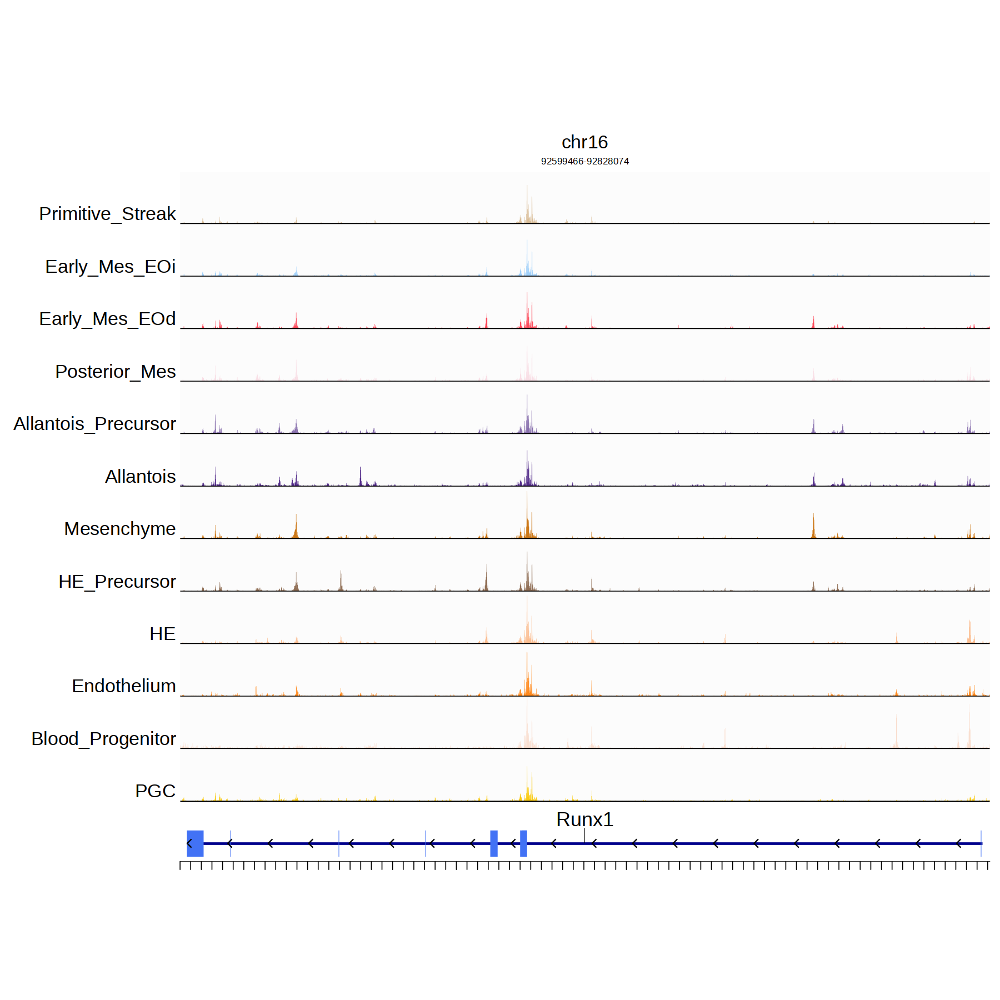

In [39]:
downsample = 1
heights = 2
gene_heights = 2

options(repr.plot.width = 15, repr.plot.height = 15)
plot_browser_track(gene = 'Runx1', input_region = NULL, bigwigs = WT_plot, extend.upstream = 2000, extend.downstream = 1e5, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)

In [521]:
bigwig_order = c('ExE_mesoderm (Atlas)','Posterior_Mes','Allantois_Precursor',
                 'Allantois (Atlas)','Allantois',
                 'Mesenchyme (Atlas)','Mesenchyme'
                )

WT_plot = bigwigs.data %>% copy() %>%
    .[genotype %in% c('WT', 'Atlas')] %>% 
    .[, name := ifelse(genotype=='WT', celltype, name)] %>% 
    .[, color := ifelse(genotype=='WT', opts$celltype_v2.colors[celltype], color)] %>% 
    .[match(bigwig_order, name)]

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Warning message:
“ggrepel: 9 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


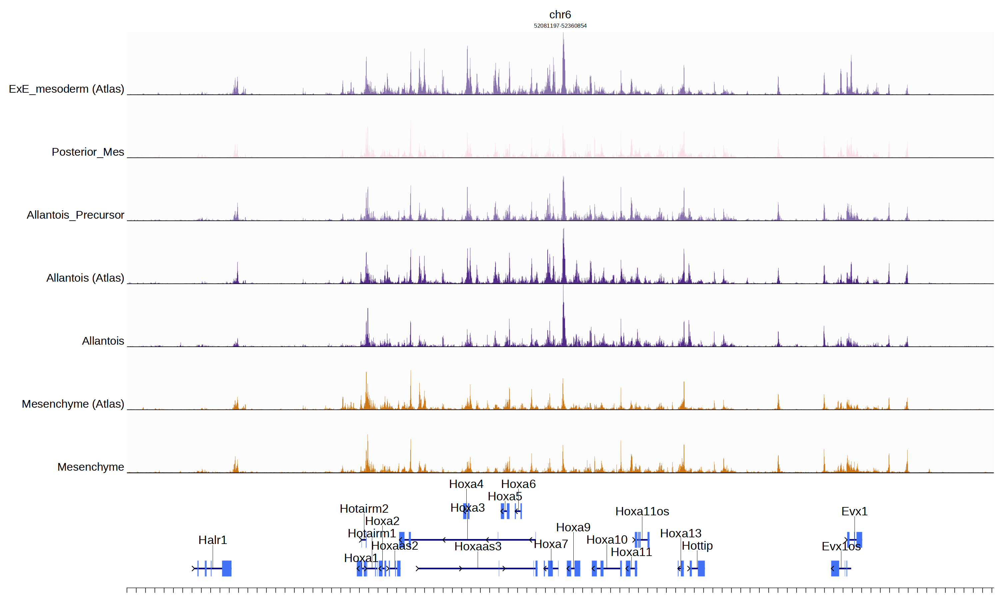

In [527]:
options(repr.plot.width = 25, repr.plot.height = 15)
WT_plot_in = WT_plot
downsample = 1
heights = 4
p1 = plot_browser_track(gene = 'Hoxa10', input_region = NULL, highlight_regions = NULL, bigwigs = WT_plot_in, extend.upstream = 1.5e5, extend.downstream = 1.2e5, downsample.rate = downsample, bw_height = heights, gene_height = 7)
p1

In [174]:
# old and super slow signac implementation for plotting
plot_browser_track = function(gene = NULL, # Only choose one of gene/input_region, otherwise will use region
                              input_region = NULL, 
                              bigwigs, 
                              extend.upstream = 0,
                              extend.downstream = 0, 
                              highlight_regions = NULL,
                              downsample.rate = 0.005, 
                              no_label = F, 
                              bw_height = 1, 
                              gene_height = 2.5){
    
    # x-axis labels function 
    alternate_labels <- function(x) {
      ifelse(seq_along(x) %% 2 == 0, paste("\n", x), x)
    }
    
    if(!is.null(gene)){
        # Get region around gene
        region = ArchRProject@geneAnnotation$genes[grep(paste0('^', gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
        start(ranges(region)) = start(ranges(region)) - extend.upstream
        end(ranges(region)) = end(ranges(region)) + extend.downstream
        gr <- GRanges(c(seqnames(region)), IRanges(start=start(ranges(region)), end=end(ranges(region))), strand='+')
    }
    if(!is.null(input_region)){
        # Get supplied region as Granges
        gr <- GRanges(c(str_split(input_region, ':') %>% map_chr(1)), 
                      IRanges(start=as.numeric(str_split(str_split(input_region, ':') %>% map_chr(2), '-') %>% map_chr(1)) - extend.upstream, 
                              end=as.numeric(str_split(str_split(input_region, ':') %>% map_chr(2), '-') %>% map_chr(2)) + extend.downstream), 
                        strand='+')
    }
    
    # Get bigwig info
    bw_list = lapply(bigwigs$path, function(x)return(x))
    names(bw_list) = bigwigs$name
    bigwigs.colors = bigwigs$color
    names(bigwigs.colors) = bigwigs$name
    
    # Get Bigwig tracks
    p1 = BigwigTrack(
      region = gr,
      bigwig = bw_list,
      smooth = NULL,
      extend.upstream = 0,
      extend.downstream = 0,
      type = "coverage",
      y_label = "bigWig",
      bigwig.scale = "common",
      max.downsample = 20,
      downsample.rate = downsample.rate
    ) + 
        ggtitle(label = paste0(seqnames(gr)),
                subtitle = paste0(ranges(gr))) + #, ':', ranges(gr))) + 
        geom_hline(yintercept = 0, color='black') +
        geom_segment(data = as.data.table(gr)[,bw:=bigwigs[1,name]], # Add background segment to make sure x-axis is correct
            mapping = aes(x = start, y = 0, xend = end, yend = 0), color = 'grey95', alpha=0) +
        scale_fill_manual(values = bigwigs.colors) + 
        scale_x_continuous(expand=c(0,0)) + 
        scale_y_continuous(expand=c(0,0.005)) +
        theme(axis.text.y = element_blank(),
                    strip.text.y = element_text(hjust=1, color='black', size = 20, vjust=0),
                    axis.line = element_blank(),
                    axis.text.x = element_blank(),
                    axis.ticks = element_blank(), 
                    axis.title = element_blank(),
                    legend.position = 'none',
                    plot.title = element_text(size = 20, hjust=0.5, face='plain'),
                    plot.subtitle = element_text(size = 10, hjust=0.5, face='plain'),
                    panel.background = element_rect(fill='grey95'),
                    panel.spacing = unit(0, "lines")) 
    
    # Remove y-text if needed
    if(no_label){
        p1 = p1 + theme(strip.text.y = element_text(size = 0), 
                        strip.background = element_blank(),
                        plot.margin = unit( c(0,0,0,0) , units = "lines" ) )
    }
    
    # Add Highlights
    if(!is.null(highlight_regions)){
        # Keep only highlights in the display range
        highlights = GRanges(c(str_split(highlight_regions, ':') %>% map_chr(1)), 
                      IRanges(start=as.numeric(str_split(str_split(highlight_regions, ':') %>% map_chr(2), '-') %>% map_chr(1)), 
                              end=as.numeric(str_split(str_split(highlight_regions, ':') %>% map_chr(2), '-') %>% map_chr(2))), 
                        strand='+')
        
        highlight_in_region = findOverlaps(highlights, gr, ignore.strand = T, type = 'within')
        highlight_regions = highlight_regions[queryHits(highlight_in_region)]
        
        # Add highlight display
        highlights.dt = data.table(start = as.numeric(str_split(str_split(highlight_regions, ':') %>% map_chr(2), '-') %>% map_chr(1)),
                                   end = as.numeric(str_split(str_split(highlight_regions, ':') %>% map_chr(2), '-') %>% map_chr(2))) %>% 
                        .[, .(start, end, vector_column = rep(unique(p1$data$bw), each = 1)), by = .(row_index = 1:nrow(.))] %>% 
                        .[, position := start] %>% .[,score := 0]

        p1 = p1 + geom_rect(data = highlights.dt, aes(xmin=start, xmax=end, ymin=0, ymax=max(p1$data$score)), 
                            color=NA, fill = 'white', alpha=1)
        # Change layers around so highlight is behind bigwig
        p1$layers = list(p1$layers[[3]], p1$layers[[4]], p1$layers[[1]], p1$layer[[2]])
    }

    # Get genome annotation
    annotation.genes = ArchRProject@geneAnnotation$genes 
    annotation.genes = annotation.genes[grep("^Rik|Rik$|^Gm|^Mir", annotation.genes$symbol, invert=T)] # remove uninformative genes from plotting
 
    annotation.exons = ArchRProject@geneAnnotation$exons
    annotation.exons = annotation.exons[grep("^Rik|Rik$|^Gm|^Mir", annotation.exons$symbol, invert=T)]
    
    # Search for genes within region
    tmp1 = findOverlaps(gr, annotation.genes, ignore.strand = T)
    tmp2 = findOverlaps(gr, annotation.exons, ignore.strand = T)
    
    # Add gene track if there are any genes in the window
    if(length(subjectHits(tmp1)) > 0){
        # get overlap among genes
        overlap = as.data.table(findOverlaps(annotation.genes[subjectHits(tmp1)], annotation.genes[subjectHits(tmp1)], type = 'any', ignore.strand = T))

        # check if genes overlap, and if so move different rows
        solver = list()
        for(x in unique(overlap$queryHits)){
            overlaps = overlap[queryHits==x & subjectHits <= x]
            nr_overlaps = nrow(overlaps)
        # No overlap --> Row = 0
            if(nr_overlaps == 1){
                rows = 1
        # 1 overlap --> check which row it was on
            }else{
               rows = setdiff(1:10, rbindlist(solver[overlaps$subjectHits])$row)[1]
            }
        #If overlap is after, do nothing
            solver[[x]] = data.table(queryHits = x,
                                     row = rows)
        }
        solved = rbindlist(solver)

        # keep overlapping genes/exons
        tmp1 = as.data.table(annotation.genes[subjectHits(tmp1)]) %>% 
            .[,row := solved$row] %>% .[width>200] # remove super short genes

        tmp2 = as.data.table(annotation.exons[subjectHits(tmp2)]) %>% 
            merge(., tmp1[,c('symbol', 'row')], by='symbol') # Add rown information

        # Cutoff genes/exon if they fall outside of the range
        tmp1 = tmp1 %>% 
            .[, `:=`(start = ifelse(start <= start(ranges(gr)), start(ranges(gr)), start),
                     end = ifelse(end >= end(ranges(gr)), end(ranges(gr)), end))]

        tmp2 = tmp2 %>% 
            .[, `:=`(start = ifelse(start <= start(ranges(gr)), start(ranges(gr)), start),
                     end = ifelse(end >= end(ranges(gr)), end(ranges(gr)), end))] %>% unique()

        # Add Arrows to indicate orientation
        width = end(ranges(gr)) - start(ranges(gr))

        tmp3 = lapply(1:nrow(tmp1), function(x){
            tmp = tmp1[x,]
            tmpp = data.table(
                          start = seq(tmp$start + 20, tmp$end + 20, by = width/20),
                          end = seq(tmp$start + 40, tmp$end + 40, by = width/20),
                          symbol = tmp$symbol,
                          row = tmp$row)
            return(tmpp)
        }) %>% rbindlist()


        # Plot gene track 
        p = ggplot() + # rbind(tmp1, tmp1 %>% copy() %>% .[,row:=row+1]), aes(start, row)
            geom_segment(data = as.data.table(gr), # Add background segment to make sure x-axis is correct
                         mapping = aes(x = start, y = 1, xend = end, yend = 1), color = 'white') +
            geom_segment(data = tmp1, 
                mapping = aes(x = start, y = row, 
                xend = end, yend = row), color = 'darkblue', show.legend = FALSE, linewidth = unit(1, 'cm')) +
            geom_segment(data = tmp2, 
                mapping = aes(x = start, y = row, 
                xend = end, yend = row), color = '#4272f5', show.legend = FALSE, linewidth = unit(10, 'cm'))
        for(i in 1:nrow(tmp1)){
            tmp = tmp1[i,]
            if(as.character(tmp$strand) == '+'){
                p = p + geom_segment(data = tmp3[symbol == tmp$symbol], 
                        mapping = aes(x = start, y = row, 
                xend = end, yend = row), arrow = arrow(ends = "last", 
                        type = "open", angle = 45, length = unit(x = 0.09, 
                        units = "inches")), show.legend = FALSE, color='black', 
                        size = 1/2)
               }else{
              p = p + geom_segment(data = tmp3[symbol == tmp$symbol], 
                        mapping = aes(x = start, y = row, 
                xend = end, yend = row), arrow = arrow(ends = "first", 
                        type = "open", angle = 45, length = unit(x = 0.09, 
                        units = "inches")), show.legend = FALSE, color='black', 
                        size = 1/2)  
            }
        }


        p = p + 
            #xlim(start(ranges(gr)), end(ranges(gr))) + 
            ggrepel::geom_text_repel(data = tmp1, aes(label = symbol, x = end - (end - start)/2 , y = row), 
                                     size = 7.5, color = 'black', 
                                     direction = "y",
                                     force_pull   = 0, # do not pull toward data points
                                     nudge_y      = 1,
                                     segment.size = 0.2
                                    ) + 
            ylim(0.5, max(c(1, tmp1$row) + 1))

    }else{
        p = ggplot() + # rbind(tmp1, tmp1 %>% copy() %>% .[,row:=row+1]), aes(start, row)
            geom_segment(data = as.data.table(gr), # Add background segment to make sure x-axis is correct
                         mapping = aes(x = start, y = 1, xend = end, yend = 1), color = 'white') +
            ylim(0.5, 2)
        
        
        
    }
    p = p + 
        scale_x_continuous(expand = c(0,0), labels = alternate_labels, breaks = seq(start(ranges(gr)), end(ranges(gr)), 3000)) + # breaks = scales::pretty_breaks(n = 1))
        theme_void() + 
        theme( #axis.text.x = element_text(size=15, color='black', vjust=0.9),
               axis.ticks.x = element_line(color='black'), 
               axis.ticks.length.x = unit(0.3, 'cm'),
               axis.line.x = element_line(color='black', linewidth=0.3),
)
                     
    patchwork::wrap_plots(plotlist = list(p1, p), ncol = 1, heights = unit(c(nrow(bigwigs)*bw_height, gene_height), c('cm', 'cm')))

}

In [77]:
gene = 'Dlk1'
extend.upstream = 10000
extend.downstream = 10000
region = ArchRProject@geneAnnotation$genes[grep(paste0('^', gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
        start(ranges(region)) = start(ranges(region)) - extend.upstream
        end(ranges(region)) = end(ranges(region)) + extend.downstream
        gr <- GRanges(c(seqnames(region)), IRanges(start=start(ranges(region)), end=end(ranges(region))), strand='+')
    

In [78]:
bigwigs = WT_plot

In [79]:
# Get bigwig info
    bw_list = lapply(bigwigs$path, function(x)return(x))
    names(bw_list) = bigwigs$name
    bigwigs.colors = bigwigs$color
    names(bigwigs.colors) = bigwigs$name

In [80]:
    coverages = mclapply(names(bw_list), function(x){
        region_data <- as.data.table(rtracklayer::import(con = bw_list[[x]], 
                    which = gr))
        region_data = rbind(region_data, region_data %>% copy() %>% .[,start:=end]) %>% 
            .[order(start)] %>% 
            .[,c('start', 'score')] %>% 
            .[, bw := factor(names(bw_list[x]), levels = names(bw_list[x]))] %>% 
        return(region_data)
    }, mc.cores = max(1,detectCores()-2)) %>% rbindlist()

In [81]:
tmp1 = coverages[bw == 'Early_Mes_EOi']
tmp2 = coverages[bw == 'Early_Mes_EOd']

In [83]:
test = merge(tmp1, tmp2, by = 'start')

In [84]:
test$score = test$score.x - test$score.y

In [85]:
head(test)

start,score.x,bw.x,score.y,bw.y,score
<int>,<dbl>,<fct>,<dbl>,<fct>,<dbl>
109442823,0.01016757,Early_Mes_EOi,0.008685146,Early_Mes_EOd,0.001482428
109443000,0.01016757,Early_Mes_EOi,0.006513860,Early_Mes_EOd,0.003653714
109443001,0.01779325,Early_Mes_EOi,0.013027720,Early_Mes_EOd,0.004765535
109443100,0.01779325,Early_Mes_EOi,0.013027720,Early_Mes_EOd,0.004765535
109443101,0.00000000,Early_Mes_EOi,0.019541580,Early_Mes_EOd,-0.019541580
109443200,0.00000000,Early_Mes_EOi,0.019541580,Early_Mes_EOd,-0.019541580


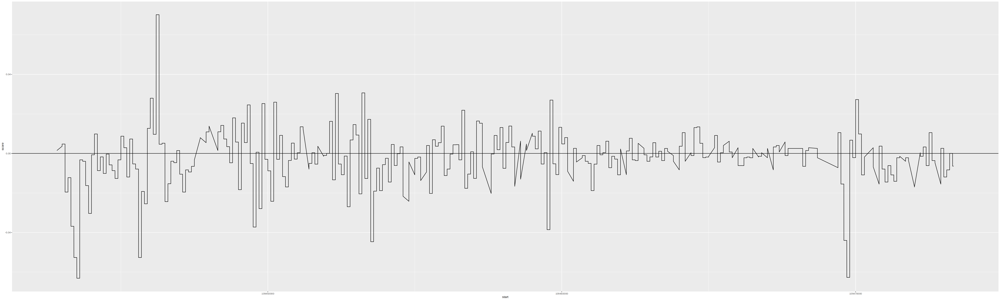

In [86]:
ggplot(test, aes(start, score)) + geom_line() + geom_hline(yintercept = 0)

In [ ]:
plot_browser_track(gene = 'Dlk1', input_region = NULL, bigwigs = WT_plot, extend.upstream = 1e5, extend.downstream = 1e5, downsample.rate = downsample, bw_height = heights, gene_height=gene_heights)

In [88]:
WT_plot[celltype %in% c('Early_Mes_EOi', 'Early_Mes_EOd')]

celltype,genotype,path,name,color
<chr>,<chr>,<chr>,<fct>,<chr>
Early_Mes_EOi,WT,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Early_Mes_EOi.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw,Early_Mes_EOi,#a0d0fa
Early_Mes_EOd,WT,/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/GroupBigWigs/celltypeV2_genotype/Early_Mes_EOd.WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw,Early_Mes_EOd,#fc4c5c
